# ICESat-2 Analysis: Tuolumne
Originally written by David Shean - notebook named GM_analysis_20211122.ipynb 
November 22, 2021  

Adapted by Hannah Besso
June 2022
Use conda environment datum_reproj3

### To do:
* Pull in ASO snow depth data, compare to nearby (spatially, temporally?) IS2 tracks

In [1]:
import os
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as cx
import scipy.stats
from matplotlib_scalebar.scalebar import ScaleBar
import matplotlib.dates as mdates
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)
from astropy.time import Time
import datetime
import rioxarray as rxr
from rasterio.plot import show
import rasterio as rio
from rasterio import features
import hvplot.pandas
#from holoviews.element.tiles import EsriImagery, StamenTerrain
from geoviews import opts, tile_sources as gvts
#from imview.lib import pltlib

In [2]:
%matplotlib inline

In [3]:
plt.rcParams['figure.facecolor']='w'
plt.rcParams['axes.facecolor']='w'
plt.rcParams['savefig.facecolor']='w'

plt.rcParams['font.size'] = '16'

In [4]:
pd.set_option('display.max_columns', None)

In [5]:
def nmad(df):
    return scipy.stats.median_abs_deviation(df, nan_policy='omit', scale='normal')

def p16(df):
    return np.nanpercentile(df, 16)

def p84(df):
    return np.nanpercentile(df, 84)

def spread(df):
    return p84(df) - p16(df)

In [6]:
#Add DOY and DOWY column
def add_dowy(df, col=None):
    print("Adding Day of Water Year (DOWY)")
    if col is None:
        df['doy'] = df.index.dayofyear
        df['decyear'] = Time(df.index).decimalyear
    else:
        df['doy'] = pd.to_datetime(df[col]).dt.dayofyear
        df['decyear'] = Time(pd.to_datetime(df[col])).decimalyear
    
    #df['dowy'] = (df['doy'].index - pd.DateOffset(months=9)).dayofyear
    # Sept 30 is doy 273
    df['dowy'] = df['doy'] - 273
    df.loc[df['dowy'] <= 0, 'dowy'] += 365

In [7]:
#map_tiles = EsriImagery()
#map_tiles = StamenTerrain()
map_tiles = gvts.StamenTerrain

In [8]:
kw = {'width':500, 'height':400, 'hover':False, 'data_aspect':1, 'alpha':1.0}
kw['colorbar'] = True
kw['cmap'] = 'inferno'
#kw['s'] = 1
#kw['aggregator'] = 'mean'
#kw['rasterize'] = False
#Using datashade drops colorbar
kw['datashade'] = True
#kw['dynamic'] = True
#kw['backend'] = 'matplotlib'

# Load SlideRule

In [9]:
atl06sr_fn = '../../data/atl06/tuolumne_all_sr-atl06-06032022.geojson'
atl06sr_gdf_ll = gpd.read_file(atl06sr_fn)
atl06sr_gdf_ll.time = pd.DatetimeIndex(atl06sr_gdf_ll.time)
atl06sr_gdf_ll = atl06sr_gdf_ll.set_index(['time'])
atl06sr_gdf_ll.sort_index(inplace=True)
atl06sr_gdf_ll['acqdate'] = atl06sr_gdf_ll.index.date
atl06sr_col = 'h_mean'
atl06sr_title = 'ICESat-2 ATL06-SR 40m (ground)'
atl06sr_gdf_ll.shape

(152603, 17)

In [10]:
atl06sr_gdf_ll.head(2)

,delta_time,w_surface_window_final,dh_fit_dx,spot,segment_id,pflags,h_mean,gt,rms_misfit,h_sigma,n_fit_photons,cycle,distance,dh_fit_dy,rgt,geometry,acqdate
time,,,,,,,,,,,,,,,,,
2018-10-15 23:22:20.018965,2.488094e+07,3.0,-0.018228,4,210188,0,2501.377184,30,0.091912,0.033182,15,1,4.215353e+06,0.0,265,POINT (-119.62341 37.88878),2018-10-15
2018-10-15 23:22:20.021811,2.488094e+07,3.0,-0.010939,4,210189,0,2501.116873,30,0.109110,0.028329,18,1,4.215373e+06,0.0,265,POINT (-119.62343 37.88896),2018-10-15


<AxesSubplot:>

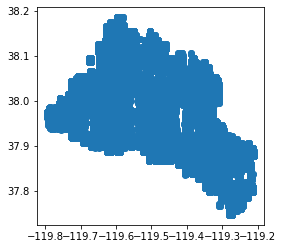

In [14]:
fig, ax = plt.subplots()
atl06sr_gdf_ll.plot(ax=ax)
#gm.iloc[0:1].plot(ax=ax, alpha=0.5)

In [15]:
atl06sr_gdf_ll.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [11]:
atl06sr_gdf = atl06sr_gdf_ll.to_crs('epsg:32611')

In [12]:
add_dowy(atl06sr_gdf)

Adding Day of Water Year (DOWY)


In [128]:
atl06sr_gdf.head(2)

,delta_time,w_surface_window_final,dh_fit_dx,spot,segment_id,pflags,h_mean,gt,rms_misfit,h_sigma,n_fit_photons,cycle,distance,dh_fit_dy,rgt,geometry,acqdate,doy,decyear,dowy
time,,,,,,,,,,,,,,,,,,,,
2018-10-15 23:22:20.018965,2.488094e+07,3.0,-0.018228,4,210188,0,2501.377184,30,0.091912,0.033182,15,1,4.215353e+06,0.0,265,POINT (269304.074 4196719.705),2018-10-15,288,2018.788969,15
2018-10-15 23:22:20.021811,2.488094e+07,3.0,-0.010939,4,210189,0,2501.116873,30,0.109110,0.028329,18,1,4.215373e+06,0.0,265,POINT (269302.684 4196739.709),2018-10-15,288,2018.788969,15


## Export a snow-off point file for use with pc_align

### First, I compared snow-off identification techniques:
* David's method: use Snotel (there are no snotel sites within the study area, so this is extrapolating a bit)
* Cesar and Simon's method: use the number of photon returns per segment  

### -> The photon number did not work at either the Methow or Tuolumne, so proceeding using SNOTEL/CDEC data.

In [20]:
# Did this to create a csv file to use with pc_align
#atl06sr_gdf_ll['x'] = atl06sr_gdf_ll.geometry.x.values
#atl06sr_gdf_ll['y'] = atl06sr_gdf_ll.geometry.y.values
#add_dowy(atl06sr_gdf_ll)
#atl06sr_gdf_ll.to_csv(r'ATL06-SR_Methow_20220201183616_004.csv', index=None)

## Load a polygon of the study area

In [13]:
outline_gdf = gpd.read_file('../data/UpperTuolRiverBasinOutline.geojson')

In [14]:
outline_gdf

,DN,geometry
0,0,"MULTIPOLYGON (((-119.79834 37.95837, -119.7980..."
1,1,"MULTIPOLYGON (((-119.58991 38.18616, -119.5888..."


<AxesSubplot:>

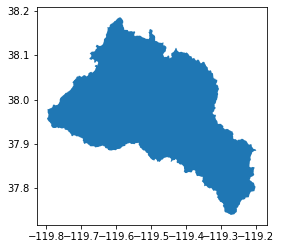

In [23]:
outline_gdf[0:1].plot()

In [24]:
outline_gdf[0:1]

,DN,geometry
0,0,"MULTIPOLYGON (((-119.79834 37.95837, -119.7980..."


In [25]:
outline_gdf[1:2]

,DN,geometry
1,1,"MULTIPOLYGON (((-119.58991 38.18616, -119.5888..."


<AxesSubplot:>

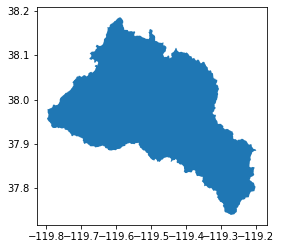

In [26]:
outline_gdf[1:2].plot()

In [15]:
outline_gdf = outline_gdf[0:1]

In [28]:
outline_gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

<AxesSubplot:>

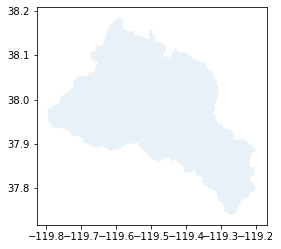

In [29]:
outline_gdf.plot(alpha=0.1)

### Project to UTM Zone 11N

In [16]:
outline_gdf = outline_gdf.to_crs('EPSG:32611')

### Find the Area of the Study Site

In [17]:
tuol_area = outline_gdf['geometry'].area/ 10**6
tuol_area

0    1181.214
dtype: float64

In [17]:
# This is UTM Zone 11N
outline_snowoff_extent = outline_gdf.total_bounds
outline_snowoff_extent

array([ 254150.46758943, 4179330.93446075,  306650.46758943,
       4229640.93446075])

In [18]:
outline_gdf.total_bounds

array([ 254150.46758943, 4179330.93446075,  306650.46758943,
       4229640.93446075])

<AxesSubplot:>

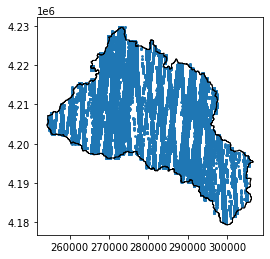

In [34]:
fig, ax = plt.subplots()

atl06sr_gdf.plot(ax=ax, markersize=3)
outline_gdf.plot(ax=ax, facecolor='none', edgecolor='k')

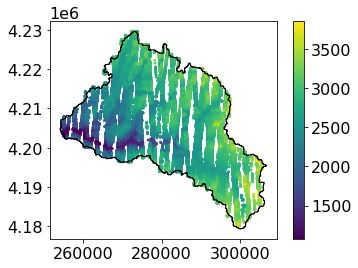

In [212]:
fig, ax = plt.subplots()

atl06sr_gdf.plot(column='h_mean', ax=ax, markersize=3, legend=True)
outline_gdf.plot(ax=ax, facecolor='none', edgecolor='k');

## Find the approximate center of the Methow lidar data and make a 60km radius around it, for identifying nearby snotel

In [36]:
#from shapely.geometry import Point

In [37]:
# # Find the center

# x1, y1 = dnr_snowoff_extent[0], dnr_snowoff_extent[1]
# x2, y2 = dnr_snowoff_extent[2], dnr_snowoff_extent[3]

# x_center = (x1 + x2) / 2
# y_center = (y1 + y2) / 2

# center = Point((x_center,y_center))
# print(center)

POINT (704824.5821600494 5378450.688569823)


In [38]:
# df_center= pd.DataFrame({'Location':['center']})
# gdf_center = gpd.GeoDataFrame(df_center, geometry=[center])
# gdf_center['geometry'] = gdf_center.geometry.buffer(60000)
# gdf_center

,Location,geometry
0,center,"POLYGON ((764824.582 5378450.689, 764535.666 5..."


# Temporal filters
Can do range within single year or multiple dates

In [19]:
from datetime import date

dt_min = '2018-10-03' #First light ICESat-2
dt_max = date.today()   #'2022-02-01'

## Load CDEC Snow Depth for same date range and add to time series

In [20]:
tum = pd.read_csv('../data/CDEC/TUM_18.csv')
dan = pd.read_csv('../data/CDEC/DAN_18.csv')

tum = tum.rename(columns={'OBS DATE':'OBS_DATE', 'DATE TIME':'DATE_TIME'})
dan = dan.rename(columns={'OBS DATE':'OBS_DATE', 'DATE TIME':'DATE_TIME'})

In [21]:
tum_elev = 2621.28
dan_elev = 2965

In [22]:
# from stack overflow

from datetime import date


def int2date(argdate: int) -> date:
    """
    If you have date as an integer, use this method to obtain a datetime.date object.

    Parameters
    ----------
    argdate : int
      Date as a regular integer value (example: 20160618)

    Returns
    -------
    dateandtime.date
      A date object which corresponds to the given value `argdate`.
    """
    year = int(argdate / 10000)
    month = int((argdate % 10000) / 100)
    day = int(argdate % 100)

    return date(year, month, day)

#### Fill in Nan values so OBS_DATE can be converted to DateTimeIndex  
I found the locations where this column was Nan, and then used the dates on either side to fill in.

In [23]:
tum.loc[126, 'OBS_DATE'] = 20190204.0
tum.loc[134, 'OBS_DATE'] = 20190212.0
tum.loc[394, 'OBS_DATE'] = 20191030.0

In [24]:
tum.head(2)

,STATION_ID,DURATION,SENSOR_NUMBER,SENS_TYPE,DATE_TIME,OBS_DATE,VALUE,DATA_FLAG,UNITS
0,TUM,D,18,SNOW DP,NaN,20181001.0,2.0,NaN,INCHES
1,TUM,D,18,SNOW DP,NaN,20181002.0,0.0,NaN,INCHES


#### Convert snow depth from inches to meters, convert time to datetime index, add doy

In [25]:
snwd = pd.DataFrame([tum.OBS_DATE, tum.VALUE]).transpose()
snwd.VALUE = snwd.VALUE * 2.54/100
snwd = snwd.rename(columns={'VALUE':'tum_m'})
snwd['dan_m'] = dan.VALUE * 2.54/100

snwd['Date'] = snwd['OBS_DATE'].map(lambda x: int(x))
snwd['Date'] = pd.DatetimeIndex(snwd['Date'].map(lambda x: int2date(x)))

snwd = snwd.set_index('Date')
snwd.sort_index(inplace=True)
snwd = snwd.drop(columns=['OBS_DATE'])
#add_dowy(snwd)

In [60]:
snwd.head(2)

,tum_m,dan_m
Date,,
2018-10-01,0.0508,-0.0254
2018-10-02,0.0000,NaN


### Plot the Dana and Tuolumne snow depth

Text(0, 0.5, 'Snow Depth m')

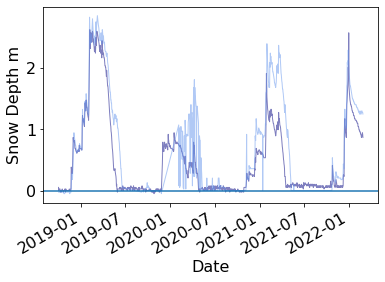

In [26]:
fig, ax = plt.subplots()
snwd['tum_m'][snwd['tum_m'] < 2.9].plot(alpha=0.5, color='navy', lw=1)
snwd['dan_m'][snwd['dan_m'] < 2.9].plot(alpha=0.5, color='cornflowerblue', lw=1)
ax.axhline(y = 0)
plt.ylabel('Snow Depth m')

Looks like Dana starts accumulating snow around the same time as Tuolumne, but melt timing is delayed at Dana and Dana consistently has higher max swe.

### Determine average snow-free dates

In [27]:
idx_st = (snwd[['tum_m', 'dan_m']] < 0.1).all(axis=1)

In [29]:
add_dowy(snwd)

Adding Day of Water Year (DOWY)


<AxesSubplot:>

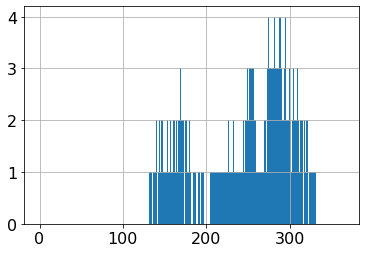

In [30]:
snwd[idx_st]['doy'].hist(bins=365, range=(0,365))

In [31]:
snowfree_doy_range = (140,330)

In [32]:
snowoff_days_percent = (snowfree_doy_range[1] - snowfree_doy_range[0]) / 360 * 100
snowoff_days_percent

52.77777777777778

In [118]:
#snwd_df.drop(['doy','dowy','decyear'], axis=1, inplace=True)

## Label data as snow off or snow on

In [33]:
idx = (atl06sr_gdf['doy'] >= snowfree_doy_range[0]) & (atl06sr_gdf['doy'] <= snowfree_doy_range[1])

In [382]:
idx

time
2018-10-15 23:22:20.018965     True
2018-10-15 23:22:20.021811     True
2018-10-15 23:22:20.027481     True
2018-10-15 23:22:20.030306     True
2018-10-15 23:22:20.033127     True
                              ...  
2022-02-06 13:36:15.554883    False
2022-02-06 13:36:15.557691    False
2022-02-06 13:36:15.560501    False
2022-02-06 13:36:15.563319    False
2022-02-06 13:36:15.585943    False
Name: doy, Length: 152603, dtype: bool

In [34]:
atl06sr_gdf['snow_presence'] = ""
atl06sr_gdf.loc[idx, 'snow_presence'] = 0
atl06sr_gdf.loc[~idx, 'snow_presence'] = 1

In [132]:
atl06sr_gdf.head(2)

,delta_time,w_surface_window_final,dh_fit_dx,spot,segment_id,pflags,h_mean,gt,rms_misfit,h_sigma,...,cycle,distance,dh_fit_dy,rgt,geometry,acqdate,doy,decyear,dowy,snow_presence
time,,,,,,,,,,,,,,,,,,,,,
2018-10-15 23:22:20.018965,2.488094e+07,3.0,-0.018228,4,210188,0,2501.377184,30,0.091912,0.033182,...,1,4.215353e+06,0.0,265,POINT (269304.074 4196719.705),2018-10-15,288,2018.788969,15,0
2018-10-15 23:22:20.021811,2.488094e+07,3.0,-0.010939,4,210189,0,2501.116873,30,0.109110,0.028329,...,1,4.215373e+06,0.0,265,POINT (269302.684 4196739.709),2018-10-15,288,2018.788969,15,0


<AxesSubplot:>

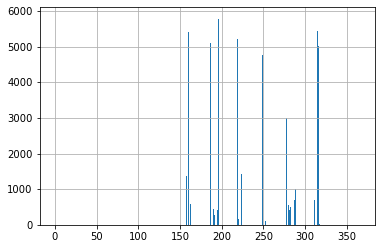

In [133]:
atl06sr_gdf['doy'][atl06sr_gdf['snow_presence'] == 0].hist(bins=365, range=(0,365))

In [65]:
#atl06sr_snowoff1 = atl06sr_snowoff.drop(columns={'acqdate'})

In [66]:
#atl06sr_snowoff1.to_file('../data/methow_snowoff_sr-atl0604272022_32610.geojson', driver='GeoJSON')

In [434]:
#atl06sr_snowoff.to_csv('data/methow_snowoff_sr-atl0604042022.csv')

# Difference with Reference DEM (ASO snow-off)

### Test how different my original snow off DEM is from the newer 2019 DEM

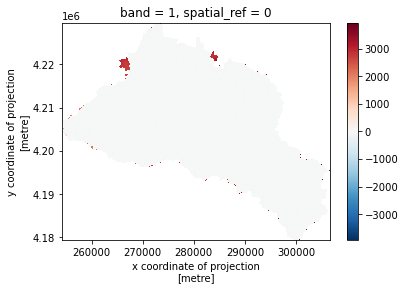

In [159]:
# Code from https://www.earthdatascience.org/courses/use-data-open-source-python/intro-raster-data-python/raster-data-processing/crop-raster-data-with-shapefile-in-python/
# from shapely.geometry import mapping

# lidar_pre_arr = rxr.open_rasterio(lidar_fn, masked=True).squeeze()
# lidar_2019_pre_arr = rxr.open_rasterio(lidar_fn_2019, masked=True).squeeze()

# lidar_clipped = lidar_pre_arr.rio.clip(outline_gdf.geometry.apply(mapping))
# lidar_clipped_2019 = lidar_2019_pre_arr.rio.clip(outline_gdf.geometry.apply(mapping))

# lidar_differences = lidar_clipped_2019 - lidar_clipped

# lidar_differences.plot()

In [168]:
# lidar_differences = atl06sr_gdf['h_mean ASO_3M_PCDTM_USCATE_20191010_20191010 diff'] - atl06sr_gdf['h_mean mcc_dem_3p0m_agg_TUOtrimmed_MANUAL diff']
# lidar_differences.describe()

count    152603.000000
mean        -52.067447
std         395.338362
min       -3858.916016
25%           0.043457
50%           0.312500
75%           0.712402
max         114.337524
dtype: float64

In [160]:
#lidar_clipped_2019.rio.to_raster('../../data/lidar/tuolumne/snow_off/ASO_3M_PCDTM_USCATE_20191010_studyextent.tif')

## Clip and save all ASO snow-on files to study area

In [37]:
aso_dir = '../../data/lidar/tuolumne/snow_on/raw'
aso_fn_list = !ls $aso_dir/ASO*.tif
aso_fn_list

['../../data/lidar/tuolumne/snow_on/raw/ASO_3M_SD_USCATE_20190324.tif',
 '../../data/lidar/tuolumne/snow_on/raw/ASO_3M_SD_USCATE_20190417.tif',
 '../../data/lidar/tuolumne/snow_on/raw/ASO_3M_SD_USCATE_20190503.tif',
 '../../data/lidar/tuolumne/snow_on/raw/ASO_3M_SD_USCATE_20190705.tif',
 '../../data/lidar/tuolumne/snow_on/raw/ASO_Tuolumne_Mosaic_snowdepth_3m_20200507.tif',
 '../../data/lidar/tuolumne/snow_on/raw/ASO_Tuolumne_Mosaic_snowdepth_3m_20220204.tif',
 '../../data/lidar/tuolumne/snow_on/raw/ASO_Tuolumne_Mosaic_snowdepth_3m_20220228.tif',
 '../../data/lidar/tuolumne/snow_on/raw/ASO_Tuolumne_Mosaic_snowdepth_3m_20220405.tif',
 '../../data/lidar/tuolumne/snow_on/raw/ASO_Tuolumne_Mosaic_snowdepth_3m_20220429.tif',
 '../../data/lidar/tuolumne/snow_on/raw/ASO_Tuolumne_Mosaic_snowdepth_3m_20220518.tif',
 '../../data/lidar/tuolumne/snow_on/raw/ASO_Tuolumne_Mosaic_snowdepth_50m_20210225.tif',
 '../../data/lidar/tuolumne/snow_on/raw/ASO_Tuolumne_snowdepth_3m_20200413.tif',
 '../../data/l

In [38]:
len(aso_fn_list)

14

In [39]:
aso_fn_list.pop(-1)

'../../data/lidar/tuolumne/snow_on/raw/ASO_Tuolumne_snowdepth_3m_20210429.tif'

In [221]:
aso_fn_list

['../../data/lidar/tuolumne/snow_on/raw/ASO_3M_SD_USCATE_20190324.tif',
 '../../data/lidar/tuolumne/snow_on/raw/ASO_3M_SD_USCATE_20190417.tif',
 '../../data/lidar/tuolumne/snow_on/raw/ASO_3M_SD_USCATE_20190503.tif',
 '../../data/lidar/tuolumne/snow_on/raw/ASO_3M_SD_USCATE_20190705.tif',
 '../../data/lidar/tuolumne/snow_on/raw/ASO_Tuolumne_Mosaic_snowdepth_3m_20200507.tif',
 '../../data/lidar/tuolumne/snow_on/raw/ASO_Tuolumne_Mosaic_snowdepth_3m_20220204.tif',
 '../../data/lidar/tuolumne/snow_on/raw/ASO_Tuolumne_Mosaic_snowdepth_3m_20220228.tif',
 '../../data/lidar/tuolumne/snow_on/raw/ASO_Tuolumne_Mosaic_snowdepth_3m_20220405.tif',
 '../../data/lidar/tuolumne/snow_on/raw/ASO_Tuolumne_Mosaic_snowdepth_3m_20220429.tif',
 '../../data/lidar/tuolumne/snow_on/raw/ASO_Tuolumne_Mosaic_snowdepth_3m_20220518.tif',
 '../../data/lidar/tuolumne/snow_on/raw/ASO_Tuolumne_Mosaic_snowdepth_50m_20210225.tif',
 '../../data/lidar/tuolumne/snow_on/raw/ASO_Tuolumne_snowdepth_3m_20200413.tif',
 '../../data/l

In [40]:
aso_feat_list = []
ovr_scale = 8
dt_fieldnum = -1
for fn in aso_fn_list:
    src = rio.open(fn)
    a = src.read(1, masked=True, out_shape=(src.count, int(src.height / ovr_scale), int(src.width / ovr_scale)))
    ovr_transform = src.transform * src.transform.scale(src.width / a.shape[-1], src.height / a.shape[-2])
    mask = np.ma.getmaskarray(a).astype(np.uint8) - 1
    shapes = features.shapes(mask, mask=mask, transform=ovr_transform)
    geom_list = list(shapes)
    dt = os.path.splitext(os.path.split(fn)[-1])[0].split('_')[dt_fieldnum]
    aso_feat_list.extend([{'properties':{'fn':fn, 'date':dt}, 'geometry':i[0]} for i in geom_list])

In [41]:
aso_gdf = gpd.GeoDataFrame.from_features(aso_feat_list, crs=src.crs)
#aso_gdf = aso_gdf.to_crs(crs)

In [42]:
aso_gdf.tail(2)

,geometry,fn,date
13,"POLYGON ((242715.000 4234848.000, 242715.000 4...",../../data/lidar/tuolumne/snow_on/raw/ASO_Tuol...,20200413
14,"POLYGON ((242718.000 4234845.000, 242718.000 4...",../../data/lidar/tuolumne/snow_on/raw/ASO_Tuol...,20200522


In [43]:
area_thresh = 1e8
aso_gdf = aso_gdf.loc[aso_gdf.area > area_thresh]

In [44]:
aso_gdf['date'] = pd.to_datetime(aso_gdf['date'])

In [45]:
aso_gdf['platform'] = 'ASO'

In [46]:
add_dowy(aso_gdf, col='date')
aso_gdf.set_index('date', inplace=True)
aso_gdf['acqdate'] = aso_gdf.index.date

Adding Day of Water Year (DOWY)


In [47]:
atl06sr_gdf['platform'] = 'SlideRule'

In [48]:
atl06sr_gdf['site'] = 'tuolumne'
aso_gdf['site'] = 'tuolumne'

## Plot time series for all obs
As usual - code taken from David Shean's GM_analysis notebook 

In [49]:
df_list = [aso_gdf, atl06sr_gdf]

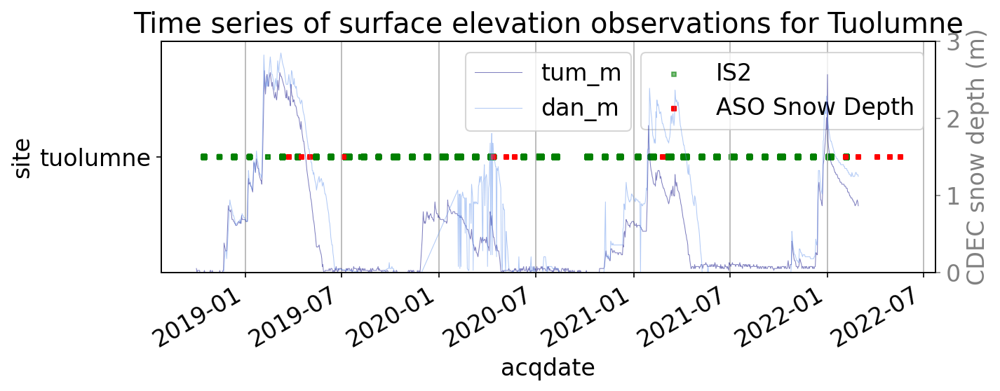

In [50]:
f, ax = plt.subplots(figsize=(10,4), dpi=150)
mykw = {'s':10, 'marker':'s', 'kind':'scatter'}

pd.DataFrame(df_list[1].drop(columns='geometry')).plot(ax=ax, alpha=0.5, x='acqdate', y='site', color='g', label='IS2', **mykw)
pd.DataFrame(df_list[0].drop(columns='geometry')).plot(ax=ax, x='acqdate', y='site', color='r', label='ASO Snow Depth', **mykw)

ax1 = ax.twinx()
snwd[snwd['tum_m'] < 2.9]['tum_m'].plot(ax=ax1, alpha=0.5, color='navy', lw=0.5, style='-')
snwd[snwd['dan_m'] < 2.9]['dan_m'].plot(ax=ax1, alpha=0.5, color='cornflowerblue', lw=0.5, style='-')
ax1.set_ylabel('CDEC snow depth (m)', color='gray')
ax1.tick_params(axis='y', colors='gray')
ax1.set_ylim(0,3)
plt.legend(loc='best')

#ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.format_xdata = mdates.DateFormatter('%Y-%m-%d')
f.autofmt_xdate()
ax.grid(axis='x', which='major')
ax.set_title('Time series of surface elevation observations for Tuolumne')
plt.tight_layout()

### List of alignable dates:
**ASO**            **IS2**
2019-03-24     datetime.date(2019, 3, 12)  
2019-04-17     datetime.date(2019, 4, 10)  
2019-05-03     datetime.date(2019, 5, 14)  
2019-07-05     datetime.date(2019, 7, 9)  
2020-04-13     datetime.date(2020, 4, 12) & datetime.date(2020, 4, 7)  
? 2020-05-22     datetime.date(2020, 6, 8)  
? 2021-02-25     datetime.date(2021, 2, 8) & datetime.date(2021, 3, 7)  
2022-02-04     datetime.date(2022, 2, 6)  

In [268]:
aso_gdf.acqdate

date
2019-03-24    2019-03-24
2019-04-17    2019-04-17
2019-05-03    2019-05-03
2019-07-05    2019-07-05
2020-05-07    2020-05-07
2022-02-04    2022-02-04
2022-02-28    2022-02-28
2022-04-05    2022-04-05
2022-04-29    2022-04-29
2022-05-18    2022-05-18
2021-02-25    2021-02-25
2020-04-13    2020-04-13
2020-05-22    2020-05-22
Name: acqdate, dtype: object

In [269]:
atl06sr_gdf.acqdate.unique()

array([datetime.date(2018, 10, 15), datetime.date(2018, 11, 13),
       datetime.date(2018, 12, 11), datetime.date(2019, 1, 9),
       datetime.date(2019, 2, 12), datetime.date(2019, 3, 12),
       datetime.date(2019, 4, 10), datetime.date(2019, 5, 14),
       datetime.date(2019, 6, 11), datetime.date(2019, 7, 9),
       datetime.date(2019, 7, 15), datetime.date(2019, 8, 7),
       datetime.date(2019, 8, 13), datetime.date(2019, 9, 9),
       datetime.date(2019, 10, 8), datetime.date(2019, 10, 14),
       datetime.date(2019, 11, 12), datetime.date(2019, 12, 9),
       datetime.date(2019, 12, 11), datetime.date(2020, 1, 7),
       datetime.date(2020, 1, 13), datetime.date(2020, 2, 5),
       datetime.date(2020, 2, 11), datetime.date(2020, 3, 9),
       datetime.date(2020, 3, 10), datetime.date(2020, 4, 7),
       datetime.date(2020, 4, 12), datetime.date(2020, 6, 8),
       datetime.date(2020, 7, 7), datetime.date(2020, 7, 12),
       datetime.date(2020, 8, 5), datetime.date(2020, 8, 10

In [219]:
aso_gdf[0:1]

,geometry,fn,platform,acqdate,doy,decyear,dowy,site
date,,,,,,,,
2019-03-24,"POLYGON ((242715.000 4234848.000, 242715.000 4...",../../data/lidar/tuolumne/snow_on/raw/ASO_3M_S...,ASO,2019-03-24,83,2019.224658,175,tuolumne


<AxesSubplot:>

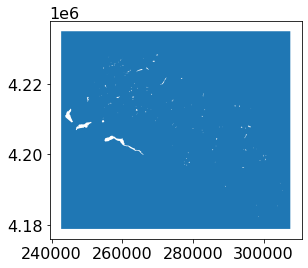

In [220]:
aso_gdf[0:1].plot()

## Load Snow Off DEM & Slope DEMs
DEM was produced by ASO, flown on Oct 10, 2019
Slope DEMs were produced via downscaling where necessary and then using gdaldem to output a slope file:  
"gdaldem slope $lidar_fn  $lidar_slope_fn -co COMPRESS=LZW -co TILED=YES"

In [51]:
lidar_fn = '../../data/lidar/tuolumne/snow_off/ASO_3M_PCDTM_USCATE_20191010_studyextent.tif'

In [52]:
lidar_snowoff_src = rio.open(lidar_fn)

In [305]:
# Get statistics about the highest and lowest elevation in the basin

#lidar_pre_arr = rxr.open_rasterio(lidar_fn)
#lidar_pre_arr = lidar_pre_arr > 0
#print(np.nanmin(lidar_pre_arr.values))
#print(np.nanmax(lidar_pre_arr.values))

3965.31

In [163]:
lidar_snowoff_src.crs

CRS.from_epsg(32611)

In [53]:
slope_fn_3m = '../../data/lidar/tuolumne/snow_off/ASO_3M_PCDTM_USCATE_20191010_studyextent_slope_3m.tif'
slope_fn_10m = '../../data/lidar/tuolumne/snow_off/ASO_3M_PCDTM_USCATE_20191010_studyextent_slope_10m.tif'
slope_fn_100m = '../../data/lidar/tuolumne/snow_off/ASO_3M_PCDTM_USCATE_20191010_studyextent_slope_100m.tif'

# slope_fn_list = ['../../data/lidar/tuolumne/snow_off/ASO_3M_PCDTM_USCATE_20191010_studyextent_slope_3m.tif', \
#                 '../../data/lidar/tuolumne/snow_off/ASO_3M_PCDTM_USCATE_20191010_studyextent_slope_10m.tif', \
#                 '../../data/lidar/tuolumne/snow_off/ASO_3M_PCDTM_USCATE_20191010_studyextent_slope_100m.tif']

# src_fn_list = ['src_slo_3m', 'src_slo_10m', 'src_slo_100m']

In [86]:
# for file, src in zip(slope_fn_list, src_fn_list):
#     src = rio.open(file)

In [88]:
type(src)

rasterio.io.DatasetReader

In [38]:
# Create the slope tif from the DEM. The other iterations (at coarser spatial resolution)
# were done in the command line with datum_reproj environment.

# !gdaldem slope $lidar_fn  $lidar_slope_fn -co COMPRESS=LZW -co TILED=YES

0...10...20...30...40...50...60...70...80...90...100 - done.


In [54]:
src_slo_3m = rio.open(slope_fn_3m)
src_slo_10m = rio.open(slope_fn_10m)
src_slo_100m = rio.open(slope_fn_100m)


In [204]:
#sample_raster(atl06sr_gdf, src_asp)

'methow_basin_2018_dtm_combined_aspect'

## Sample snow-off DEM

In [55]:
def sample_raster(df, src, diff_col=None):
    #df_proj = df.to_crs(src.crs)
    coord = [(pt.x, pt.y) for pt in df.to_crs(src.crs).geometry]
    s = np.fromiter(src.sample(coord), dtype=src.dtypes[0])
    #s[s == src.nodata] = np.nan
    sm = np.ma.masked_equal(s, src.nodata)
    sample_colname = os.path.splitext(os.path.split(src.name)[-1])[0]
    df[sample_colname] = sm
    if diff_col is not None:
        out_colname = '{} {} diff'.format(diff_col, sample_colname)
        df[out_colname] = df[diff_col] - df[sample_colname]
    else:
        out_colname = sample_colname
    return out_colname

In [56]:
# Sample snow-off lidar

atl06sr_diff_col = sample_raster(atl06sr_gdf, lidar_snowoff_src, diff_col=atl06sr_col)
atl06sr_diff_col

'h_mean ASO_3M_PCDTM_USCATE_20191010_studyextent diff'

In [57]:
# Sample 3m resolution slope map

sample_raster(atl06sr_gdf, src_slo_3m)

'ASO_3M_PCDTM_USCATE_20191010_studyextent_slope_3m'

In [58]:
# Sample 10m resolution slope map

sample_raster(atl06sr_gdf, src_slo_10m)

'ASO_3M_PCDTM_USCATE_20191010_studyextent_slope_10m'

In [59]:
# Sample 100m resolution slope map

sample_raster(atl06sr_gdf, src_slo_100m)

'ASO_3M_PCDTM_USCATE_20191010_studyextent_slope_100m'

In [43]:
atl06sr_gdf.head(2)

,delta_time,w_surface_window_final,dh_fit_dx,spot,segment_id,pflags,h_mean,gt,rms_misfit,h_sigma,...,rgt,geometry,acqdate,doy,decyear,dowy,snow_presence,ASO_3M_PCDTM_USCATE_20191010_studyextent,h_mean ASO_3M_PCDTM_USCATE_20191010_studyextent diff,ASO_3M_PCDTM_USCATE_20191010_studyextent_slope_3m
time,,,,,,,,,,,,,,,,,,,,,
2018-10-15 23:22:20.018965,2.488094e+07,3.0,-0.018228,4,210188,0,2501.377184,30,0.091912,0.033182,...,265,POINT (269304.074 4196719.705),2018-10-15,288,2018.788969,15,0,2501.669922,-0.292738,1.725123
2018-10-15 23:22:20.021811,2.488094e+07,3.0,-0.010939,4,210189,0,2501.116873,30,0.109110,0.028329,...,265,POINT (269302.684 4196739.709),2018-10-15,288,2018.788969,15,0,2501.169922,-0.053049,4.888882


In [60]:
atl06sr_gdf = atl06sr_gdf.rename(columns={'ASO_3M_PCDTM_USCATE_20191010_studyextent':'lidar_z',
                                          'h_mean ASO_3M_PCDTM_USCATE_20191010_studyextent diff':'difference', 
                                          'ASO_3M_PCDTM_USCATE_20191010_studyextent_slope_3m':'slope_3m',
                                          'ASO_3M_PCDTM_USCATE_20191010_studyextent_slope_10m':'slope_10m',
                                          'ASO_3M_PCDTM_USCATE_20191010_studyextent_slope_100m':'slope_100m'})
atl06sr_gdf.columns

Index(['delta_time', 'w_surface_window_final', 'dh_fit_dx', 'spot',
       'segment_id', 'pflags', 'h_mean', 'gt', 'rms_misfit', 'h_sigma',
       'n_fit_photons', 'cycle', 'distance', 'dh_fit_dy', 'rgt', 'geometry',
       'acqdate', 'doy', 'decyear', 'dowy', 'snow_presence', 'platform',
       'site', 'lidar_z', 'difference', 'slope_3m', 'slope_10m', 'slope_100m'],
      dtype='object')

In [165]:
atl06sr_gdf.head(2)

,delta_time,w_surface_window_final,dh_fit_dx,spot,segment_id,pflags,h_mean,gt,rms_misfit,h_sigma,...,snow_presence,lidar_z,difference,slope_3m,diff_plus,zscore,slope_10m,slope_100m,platform,site
time,,,,,,,,,,,,,,,,,,,,,
2018-10-15 23:22:20.018965,2.488094e+07,3.0,-0.018228,4,210188,0,2501.377184,30,0.091912,0.033182,...,0,2501.669922,-0.292738,1.725123,-0.166852,-0.047266,0.962873,NaN,SlideRule,tuolumne
2018-10-15 23:22:20.021811,2.488094e+07,3.0,-0.010939,4,210189,0,2501.116873,30,0.109110,0.028329,...,0,2501.169922,-0.053049,4.888882,0.072837,-0.030189,1.995975,NaN,SlideRule,tuolumne


In [47]:
atl06sr_gdf['difference'].describe()

count    150115.000000
mean          0.370686
std          14.035993
min        -122.345178
25%          -0.419187
50%           0.312163
75%           1.171960
max        3110.671994
Name: difference, dtype: float64

## Sample snow-on ASO DEMs  
Also made a 20m resolution version of all ASO snow-on files using the following command line code:  

fn_list=$(ls *.tif)  

parallel "gdalwarp -tr 20 20 -r cubic {} {.}_20m.tif" ::: $fn_list


### List of alignable dates:
**ASO**      |         **IS2**  
2019-03-24   |  datetime.date(2019, 3, 12)  
2019-04-17   |  datetime.date(2019, 4, 10)  
2019-05-03   |  datetime.date(2019, 5, 14)  
2019-07-05   |  datetime.date(2019, 7, 9)  
2020-04-13   |  datetime.date(2020, 4, 12) & datetime.date(2020, 4, 7)  
? 2020-05-22 |    datetime.date(2020, 6, 8)  
? 2021-02-25 |    datetime.date(2021, 2, 8) & datetime.date(2021, 3, 7)  
2022-02-04   |  datetime.date(2022, 2, 6) 

In [61]:
atl06_dates = [datetime.date(2019, 3, 12), 
              datetime.date(2019, 4, 10),
              datetime.date(2019, 5, 14),
              datetime.date(2019, 7, 9),
              datetime.date(2020, 4, 12),
              datetime.date(2020, 4, 7),
              datetime.date(2020, 6, 8),
              datetime.date(2021, 2, 8),
              datetime.date(2021, 3, 7),
              datetime.date(2022, 2, 6)]

In [62]:
aso_fn_dates = ['../../data/lidar/tuolumne/snow_on/raw/ASO_3M_SD_USCATE_20190324.tif',
                 '../../data/lidar/tuolumne/snow_on/raw/ASO_3M_SD_USCATE_20190417.tif',
                 '../../data/lidar/tuolumne/snow_on/raw/ASO_3M_SD_USCATE_20190503.tif',
                 '../../data/lidar/tuolumne/snow_on/raw/ASO_3M_SD_USCATE_20190705.tif',
                 '../../data/lidar/tuolumne/snow_on/raw/ASO_Tuolumne_snowdepth_3m_20200413.tif',
                 '../../data/lidar/tuolumne/snow_on/raw/ASO_Tuolumne_snowdepth_3m_20200413.tif',
                 '../../data/lidar/tuolumne/snow_on/raw/ASO_Tuolumne_snowdepth_3m_20200522.tif',
                 '../../data/lidar/tuolumne/snow_on/raw/ASO_Tuolumne_Mosaic_snowdepth_50m_20210225.tif',
                 '../../data/lidar/tuolumne/snow_on/raw/ASO_Tuolumne_Mosaic_snowdepth_50m_20210225.tif',
                 '../../data/lidar/tuolumne/snow_on/raw/ASO_Tuolumne_Mosaic_snowdepth_3m_20220204.tif']

In [63]:
## not the original - changing to try and make applicable to specific dates of ASO/Is2 overlap

def sample_raster_dates(df, src, diff_col=None, date=datetime.date(2019, 3, 12)):
    #df_proj = df.to_crs(src.crs)
    coord = [(pt.x, pt.y) for pt in df.loc[df['acqdate'] == date].to_crs(src.crs).geometry]
    s = np.fromiter(src.sample(coord), dtype=src.dtypes[0])
    #s[s == src.nodata] = np.nan
    sm = np.ma.masked_equal(s, src.nodata)
    df.loc[df['acqdate'] == date, 'ASO_snowon'] = sm
    dt_str = os.path.splitext(os.path.split(src.name)[-1])[-2].split('_')[-1]
    df.loc[df['acqdate'] == date, 'ASO_snowon_date'] = datetime.datetime.strptime(dt_str, '%Y%m%d').date()

In [64]:
atl06sr_gdf['ASO_snowon'] = pd.Series(dtype=float)
atl06sr_gdf['ASO_snowon_date'] = pd.Series(dtype=float)

for file, date in zip(aso_fn_dates, atl06_dates):
    src = rio.open(file)
    sample_raster_dates(atl06sr_gdf, src, date=date)

In [367]:
atl06sr_gdf.tail()

,delta_time,w_surface_window_final,dh_fit_dx,spot,segment_id,pflags,h_mean,gt,rms_misfit,h_sigma,n_fit_photons,cycle,distance,dh_fit_dy,rgt,geometry,acqdate,doy,decyear,dowy,snow_presence,lidar_z,difference,slope_3m,diff_plus,zscore,slope_10m,slope_100m,platform,site,slope_bins_100m,ASO_snowon,ASO_snowon_date
time,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2022-02-06 13:36:15.554883,1.293898e+08,12.636195,0.494956,4,211392,0,3157.242677,40,0.941195,0.228813,17,14,4.239481e+06,0.0,707,POINT (288131.432 4220018.001),2022-02-06,37,2022.100183,129,1,3155.599121,1.643556,19.700527,1.769442,0.090686,26.862522,30.158386,SlideRule,tuolumne,40,2.210110,2022-02-04
2022-02-06 13:36:15.557691,1.293898e+08,13.676677,0.535804,4,211393,0,3167.738831,40,1.400303,0.433012,13,14,4.239501e+06,0.0,707,POINT (288130.038 4220038.003),2022-02-06,37,2022.100183,129,1,3170.176025,-2.437195,31.742182,-2.311309,-0.200049,32.133636,30.158386,SlideRule,tuolumne,40,0.000000,2022-02-04
2022-02-06 13:36:15.560501,1.293898e+08,12.052330,0.472031,4,211394,0,3178.398925,40,0.968869,0.266429,15,14,4.239521e+06,0.0,707,POINT (288128.654 4220058.005),2022-02-06,37,2022.100183,129,1,3179.988037,-1.589112,28.538391,-1.463226,-0.139627,27.533731,29.492956,SlideRule,tuolumne,30,1.300855,2022-02-04
2022-02-06 13:36:15.563319,1.293898e+08,12.284286,0.481139,4,211395,0,3187.941879,40,0.807702,0.208574,15,14,4.239541e+06,0.0,707,POINT (288127.292 4220078.009),2022-02-06,37,2022.100183,129,1,3189.868896,-1.927017,25.465919,-1.801132,-0.163701,26.584799,29.492956,SlideRule,tuolumne,30,1.294848,2022-02-04
2022-02-06 13:36:15.585943,1.293898e+08,14.774339,0.578889,4,211403,0,3271.341134,40,0.895211,0.259535,12,14,4.239701e+06,0.0,707,POINT (288116.521 4220238.049),2022-02-06,37,2022.100183,129,1,3275.357910,-4.016776,31.800014,-3.890891,-0.312586,31.902809,29.890511,SlideRule,tuolumne,30,0.889528,2022-02-04


## Repeat but for the 20m resolution files

In [68]:
aso_fn_dates_20m = ['../../data/lidar/tuolumne/snow_on/coarse_20m/ASO_3M_SD_USCATE_20190324_20m.tif',
                 '../../data/lidar/tuolumne/snow_on/coarse_20m/ASO_3M_SD_USCATE_20190417_20m.tif',
                 '../../data/lidar/tuolumne/snow_on/coarse_20m/ASO_3M_SD_USCATE_20190503_20m.tif',
                 '../../data/lidar/tuolumne/snow_on/coarse_20m/ASO_3M_SD_USCATE_20190705_20m.tif',
                 '../../data/lidar/tuolumne/snow_on/coarse_20m/ASO_Tuolumne_snowdepth_3m_20200413_20m.tif',
                 '../../data/lidar/tuolumne/snow_on/coarse_20m/ASO_Tuolumne_snowdepth_3m_20200413_20m.tif',
                 '../../data/lidar/tuolumne/snow_on/coarse_20m/ASO_Tuolumne_snowdepth_3m_20200522_20m.tif',
                 '../../data/lidar/tuolumne/snow_on/coarse_20m/ASO_Tuolumne_Mosaic_snowdepth_50m_20210225_20m.tif',
                 '../../data/lidar/tuolumne/snow_on/coarse_20m/ASO_Tuolumne_Mosaic_snowdepth_50m_20210225_20m.tif',
                 '../../data/lidar/tuolumne/snow_on/coarse_20m/ASO_Tuolumne_Mosaic_snowdepth_3m_20220204_20m.tif']

In [66]:
## not the original - changing to try and make applicable to specific dates of ASO/Is2 overlap

def sample_raster_dates(df, src, aso_column, date):
    #df_proj = df.to_crs(src.crs)
    coord = [(pt.x, pt.y) for pt in df.loc[df['acqdate'] == date].to_crs(src.crs).geometry]
    s = np.fromiter(src.sample(coord), dtype=src.dtypes[0])
    #s[s == src.nodata] = np.nan
    sm = np.ma.masked_equal(s, src.nodata)
    df.loc[df['acqdate'] == date, aso_column] = sm
    #dt_str = os.path.splitext(os.path.split(src.name)[-1])[-2].split('_')[-2]
    #df.loc[df['acqdate'] == date, 'ASO_snowon_date'] = datetime.datetime.strptime(dt_str, '%Y%m%d').date()

In [69]:
atl06sr_gdf['ASO_snowon_20m'] = pd.Series(dtype=float)
#atl06sr_gdf['ASO_snowon_date'] = pd.Series(dtype=float)

for file, date in zip(aso_fn_dates_20m, atl06_dates):
    src = rio.open(file)
    sample_raster_dates(atl06sr_gdf, src, 'ASO_snowon_20m', date=date)

# Save a file with all the sampled data  
Only do this when necessary. Uncomment all the cells in this section and run them.

In [85]:
# atl06sr_gdf.index = atl06sr_gdf.index.astype(str)
# atl06sr_gdf.acqdate = atl06sr_gdf.acqdate.astype(str)
# atl06sr_gdf.ASO_snowon_date = atl06sr_gdf.ASO_snowon_date.astype(str)

In [86]:
# atl06sr_gdf.to_file('../../data/atl06/atl06sr_tuolumne_all_slope_asosnowon_06272022.geojson', driver='GeoJSON')

In [96]:
# atl06sr_gdf.index = pd.DatetimeIndex(atl06sr_gdf2.index)

In [87]:
# atl06sr_fn2 = '../../data/atl06/atl06sr_tuolumne_all_slope_asosnowon_06272022.geojson'
# atl06sr_gdf2 = gpd.read_file(atl06sr_fn2)
# atl06sr_gdf2.time = pd.DatetimeIndex(atl06sr_gdf2.time)
# atl06sr_gdf2 = atl06sr_gdf2.set_index(['time'])
# atl06sr_gdf2.sort_index(inplace=True)
# atl06sr_gdf2['acqdate'] = atl06sr_gdf2.index.date
# atl06sr_col = 'h_mean'
# atl06sr_title = 'ICESat-2 ATL06-SR 40m (ground)'
# atl06sr_gdf2.shape

(152603, 31)

In [92]:
# atl06sr_gdf2['acqdate'] = pd.to_datetime(atl06sr_gdf2['acqdate'])
# atl06sr_gdf2['ASO_snowon_date'] = pd.to_datetime(atl06sr_gdf2['ASO_snowon_date'])

## Make boxplots of IS2 and CDEC

In [97]:
import matplotlib.dates as mdates
import matplotlib.cbook as cbook

In [98]:
mpl_epoch = '1970-01-01'

In [99]:
dt_min_plot = '2018-09-01'
dt_max_plot = '2022-03-01'

In [100]:
snwd.head(2)

,tum_m,dan_m,doy,decyear,dowy
Date,,,,,
2018-10-01,0.0508,-0.0254,274,2018.747945,1
2018-10-02,0.0000,NaN,275,2018.750685,2


In [54]:
#snwd = snwd[snwd['tum_m'] < 2.9]

In [61]:
def boxplot_date(df, col, groupby_col='acqdate', clim=(-5, 5), name='../Figures/boxplots_cdec.jpeg'):
    bp_stats = df[[col, groupby_col]].dropna().groupby(groupby_col).apply(cbook.boxplot_stats)
    bp_stats_list = [i[0] for i in bp_stats.values]
    bp_width = df[[col, groupby_col]].dropna().groupby(groupby_col).count().values.ravel()
    bp_width = 20*bp_width/bp_width.max()+5
    pos = (pd.to_datetime(bp_stats.index) - pd.to_datetime(mpl_epoch)).days.values
    
    f, ax = plt.subplots(figsize=(20,10))
    bxp_f = ax.bxp(bp_stats_list, positions=pos, showfliers=False, showcaps=False, whiskerprops={'lw':0.5, 'alpha':0.2}, widths=bp_width)
    
    #snwd[['tum_m', 'dan_m']].plot(ax=ax, lw=2, style=['--','-'])
    snwd['tum_m'][snwd['tum_m'] < 2.9].plot(alpha=0.5, color='navy', lw=2)
    snwd['dan_m'][snwd['dan_m'] < 2.9].plot(alpha=0.5, color='cornflowerblue', lw=2)
    
    #cso['depth_m'].plot(ax=ax, linestyle='none', marker='.', color='k', markersize=5)
    
    ax.axhline(0, color='k', lw=0.5)
    ax.set_ylabel('Elevation difference (m)')
    ax.set_ylim(*clim)
    ax.set_xlim([dt_min_plot, dt_max_plot])
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    
    years = mdates.YearLocator(month=10)
    ax.format_xdata = mdates.DateFormatter('%Y-%m-%d')
    years_fmt = mdates.DateFormatter('%Y-%m-%d')
    ax.xaxis.set_major_locator(years)
    ax.xaxis.set_major_formatter(years_fmt)
    months = mdates.MonthLocator()
    ax.xaxis.set_minor_locator(months)
    
    plt.tight_layout()
    plt.savefig(name, dpi=500)

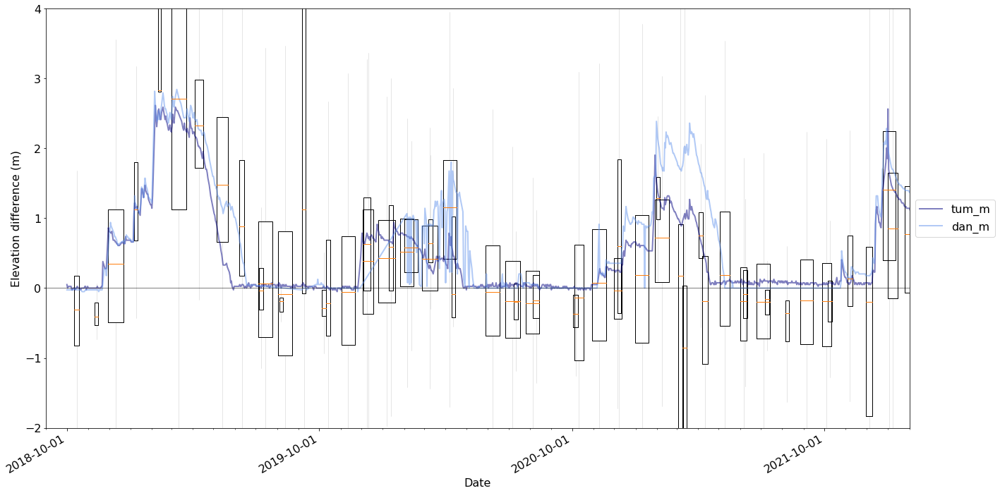

In [62]:
boxplot_date(atl06sr_gdf, 'difference', clim=(-2,4), name = '../figures/boxplots_cdec.jpeg')

In [101]:
atl06sr_gdf[atl06sr_gdf['snow_presence'] == 0]['difference'].describe()

count    61767.000000
mean         0.006891
std         21.679103
min       -122.345178
25%         -0.707285
50%         -0.125885
75%          0.530878
max       3110.671994
Name: difference, dtype: float64

In [102]:
atl06sr_gdf['diff_plus'] = atl06sr_gdf['difference'] - atl06sr_gdf[atl06sr_gdf['snow_presence'] == 0]['difference'].median()
atl06sr_gdf[atl06sr_gdf['snow_presence'] == 0]['diff_plus'].describe()

count    61767.000000
mean         0.132777
std         21.679103
min       -122.219293
25%         -0.581400
50%          0.000000
75%          0.656763
max       3110.797879
Name: diff_plus, dtype: float64

In [65]:
atl06sr_gdf['diff_plus'].describe()

count    150115.000000
mean          0.496571
std          14.035993
min        -122.219293
25%          -0.293301
50%           0.438048
75%           1.297846
max        3110.797879
Name: diff_plus, dtype: float64

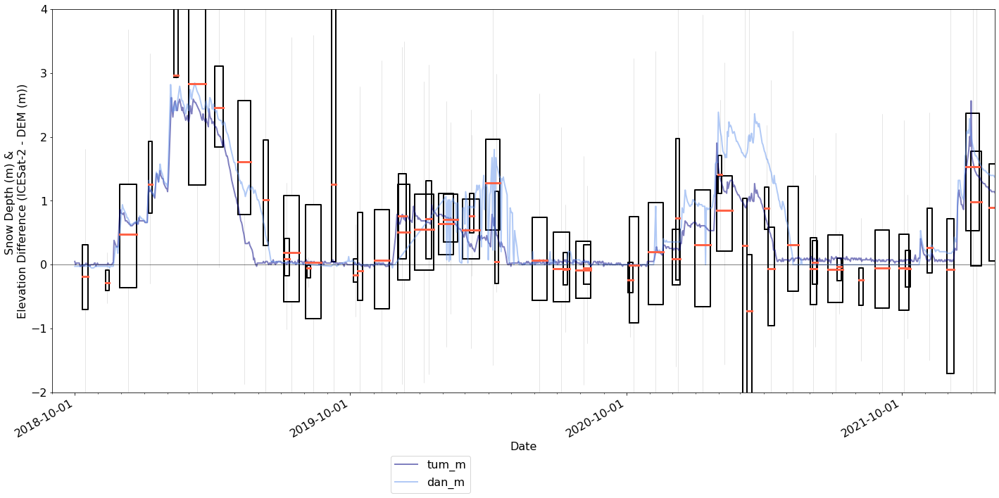

In [172]:
boxplot_date(atl06sr_gdf, 'diff_plus', clim=(-2,4), name = '../figures/boxplots_cdec_diffplus.jpeg')

### Plot With Snow-On ASO Data

In [103]:
def boxplot_date(df, col, col_aso, groupby_col='acqdate', groupby_col_aso='ASO_snowon_date', clim=(-5, 5), name='../figures/boxplots_cdec_aso.jpeg'):
    # ATL06 stats
    bp_stats = df[[col, groupby_col]].dropna().groupby(groupby_col).apply(cbook.boxplot_stats)
    bp_stats_list = [i[0] for i in bp_stats.values]
    bp_width = df[[col, groupby_col]].dropna().groupby(groupby_col).count().values.ravel()
    bp_width = 20*bp_width/bp_width.max()+5
    pos = (pd.to_datetime(bp_stats.index) - pd.to_datetime(mpl_epoch)).days.values
    
    # ASO Snow-On Stats
    bp_stats2 = df[[col_aso, groupby_col_aso]].dropna().groupby(groupby_col_aso).apply(cbook.boxplot_stats)
    bp_stats_list2 = [i[0] for i in bp_stats2.values]
    bp_width2 = df[[col_aso, groupby_col_aso]].dropna().groupby(groupby_col_aso).count().values.ravel()
    bp_width2 = 20*bp_width2/bp_width2.max()+5
    pos2 = (pd.to_datetime(bp_stats2.index) - pd.to_datetime(mpl_epoch)).days.values    
    
    f, ax = plt.subplots(figsize=(20,10))
    # Plot ATL06 data
    bxp_f = ax.bxp(bp_stats_list, positions=pos, showfliers=False, showcaps=False, whiskerprops={'lw':0.5, 'alpha':0.2}, boxprops= {'lw':1, 'c':'black'},  medianprops={'c':'green', 'lw':2},widths=bp_width)
    # Plot ASO snow on data
    bxp_f2 = ax.bxp(bp_stats_list2, positions=pos2, showfliers=False, showcaps=False, whiskerprops={'lw':0.5, 'alpha':0.2, 'c':'orange'}, boxprops= {'lw':1, 'c':'magenta'}, medianprops={'c':'orange', 'lw':2}, widths=bp_width2)
    
    #snwd[['tum_m', 'dan_m']].plot(ax=ax, lw=2, style=['--','-'])
    snwd['tum_m'][snwd['tum_m'] < 2.9].plot(alpha=0.5, color='navy', lw=2)
    snwd['dan_m'][snwd['dan_m'] < 2.9].plot(alpha=0.5, color='cornflowerblue', lw=2)
    
    #cso['depth_m'].plot(ax=ax, linestyle='none', marker='.', color='k', markersize=5)
    
    ax.axhline(0, color='k', lw=0.5)
    ax.set_ylabel('Elevation difference (m)')
    ax.set_ylim(*clim)
    ax.set_xlim([dt_min_plot, dt_max_plot])
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    
    years = mdates.YearLocator(month=10)
    ax.format_xdata = mdates.DateFormatter('%Y-%m-%d')
    years_fmt = mdates.DateFormatter('%Y-%m-%d')
    ax.xaxis.set_major_locator(years)
    ax.xaxis.set_major_formatter(years_fmt)
    months = mdates.MonthLocator()
    ax.xaxis.set_minor_locator(months)
    
    plt.tight_layout()
    plt.savefig(name, dpi=500)

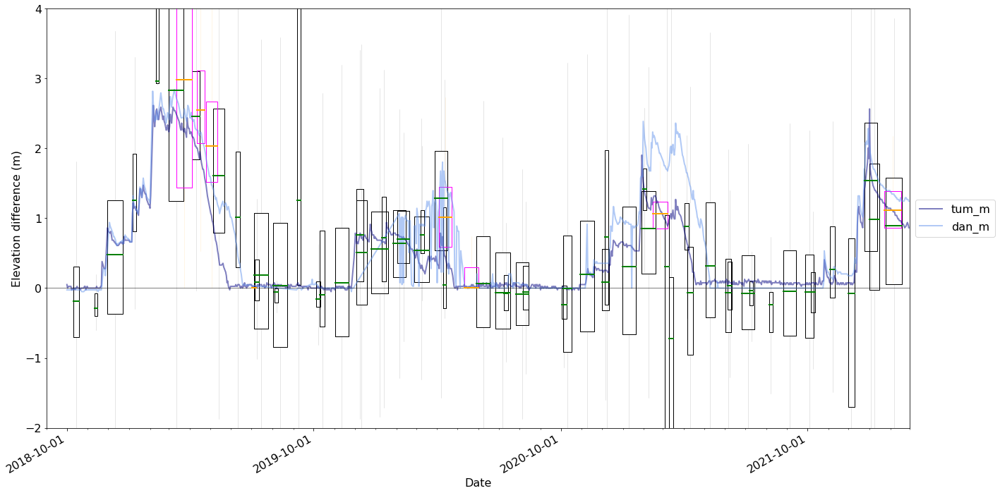

In [104]:
boxplot_date(atl06sr_gdf, 'diff_plus', 'ASO_snowon', clim=(-2,4), name = '../figures/boxplots_cdec_aso.jpeg')

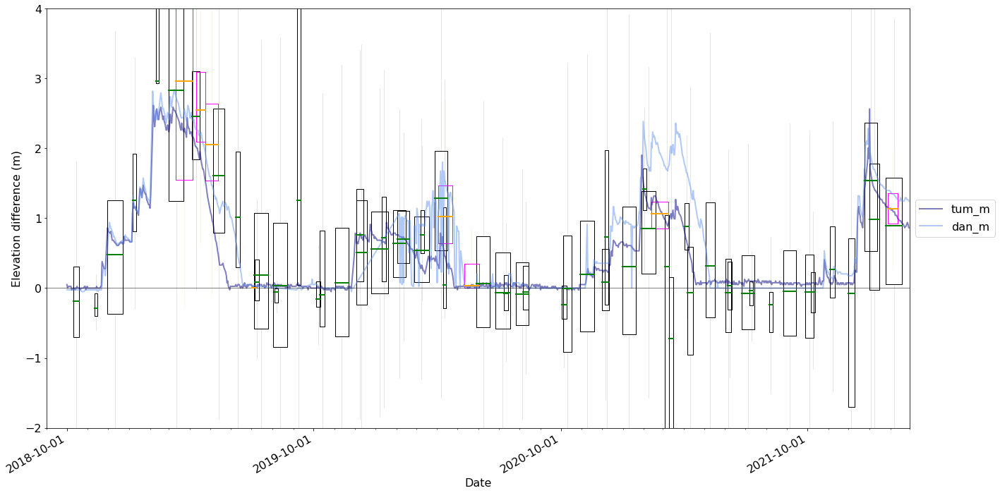

In [375]:
boxplot_date(atl06sr_gdf, 'diff_plus', 'ASO_snowon_20m', clim=(-2,4), name = '../figures/boxplots_cdec_aso.jpeg')

# Investigate individual ASO/IS2 Flight Date Locations  
Plan:  
* Individually plot (within study outline) each IS2 track that was compared to an ASO flight
* Plot each of these as an elevation profile
* Difference the medians between the two as a measure of how well they align?

In [105]:
atl06_dates

[datetime.date(2019, 3, 12),
 datetime.date(2019, 4, 10),
 datetime.date(2019, 5, 14),
 datetime.date(2019, 7, 9),
 datetime.date(2020, 4, 12),
 datetime.date(2020, 4, 7),
 datetime.date(2020, 6, 8),
 datetime.date(2021, 2, 8),
 datetime.date(2021, 3, 7),
 datetime.date(2022, 2, 6)]

## Plot a difference map for David

## Filter Outliers  
Using David's code  
Less concerned about doing this since I use the Median in my anayses

In [68]:
atl06sr_gdf['zscore'] = (atl06sr_gdf['diff_plus'] - atl06sr_gdf['diff_plus'].mean()) / atl06sr_gdf['diff_plus'].std()

zscore_thresh = 3
absdiff_thresh = 5.0

In [72]:
atl06_idx = (atl06sr_gdf['zscore'].abs() <= zscore_thresh) & (atl06sr_gdf['diff_plus'].abs() <= absdiff_thresh)

inner_snowoff_idx = (atl06sr_gdf['zscore'].abs() <= zscore_thresh) & \
    (atl06sr_gdf['diff_plus'].abs() <= absdiff_thresh) & \
    (atl06sr_gdf['snow_presence'] == 0)

inner_snowon_idx = (atl06sr_gdf['zscore'].abs() <= zscore_thresh) & \
    (atl06sr_gdf['diff_plus'].abs() <= absdiff_thresh) & \
    (atl06sr_gdf['snow_presence'] == 1)

In [73]:
atl06sr_gdf[atl06_idx]['diff_plus'].describe()

count    146367.000000
mean          0.484914
std           1.447784
min          -4.998124
25%          -0.272286
50%           0.437124
75%           1.267043
max           4.999484
Name: diff_plus, dtype: float64

In [75]:
atl06sr_gdf[inner_snowoff_idx]['diff_plus'].describe()

count    60716.000000
mean         0.026955
std          1.282298
min         -4.998124
25%         -0.554833
50%          0.005870
75%          0.652179
max          4.999458
Name: diff_plus, dtype: float64

In [76]:
atl06sr_gdf[inner_snowon_idx]['diff_plus'].describe()

count    85651.000000
mean         0.809551
std          1.470477
min         -4.997543
25%          0.059490
50%          0.775468
75%          1.618524
max          4.999484
Name: diff_plus, dtype: float64

In [ ]:
# Use only snow-off differences for offset

#atl06sr_gdf[(atl06sr_gdf['snow_presence'] == 0) & atl06sr_gdf[atl06_idx]]['diff_plus'].describe()

In [413]:
atl06sr_gdf.head(2)

,distance,dh_fit_dx,gt,spot,w_surface_window_final,h_mean,dh_fit_dy,n_fit_photons,pflags,cycle,h_sigma,rgt,rms_misfit,delta_time,segment_id,geometry,acqdate,x,y,doy,decyear,dowy,lidar_z,difference,diff_plus
time,,,,,,,,,,,,,,,,,,,,,,,,,
2018-11-09 22:09:43.662998,5.382001e+06,0.367318,20,1,9.386548,774.110259,0.0,41,0,1,0.079705,646,0.506044,2.703658e+07,268398,POINT (722265.057 5358346.501),2018-11-09,-120.000526,48.339165,313,2018.857324,40,NaN,NaN,NaN
2018-11-09 22:09:43.789001,5.382903e+06,0.028568,20,1,3.000000,919.941824,0.0,42,0,1,0.050617,646,0.305572,2.703658e+07,268443,POINT (722145.580 5359238.959),2018-11-09,-120.001665,48.347225,313,2018.857324,40,921.263184,-1.321359,-0.942767


In [77]:
def boxplot_date(df, col, groupby_col='acqdate', clim=(-5, 5), name='figures/boxplots_snotel.jpeg'):
    bp_stats = df[[col, groupby_col]].dropna().groupby(groupby_col).apply(cbook.boxplot_stats)
    bp_stats_list = [i[0] for i in bp_stats.values]
    bp_width = df[[col, groupby_col]].dropna().groupby(groupby_col).count().values.ravel()
    bp_width = 20*bp_width/bp_width.max()+5
    pos = (pd.to_datetime(bp_stats.index) - pd.to_datetime(mpl_epoch)).days.values
    
    f, ax = plt.subplots(figsize=(20,10))
    bxp_f = ax.bxp(bp_stats_list, positions=pos, showfliers=False, showcaps=False, boxprops={'lw':2}, medianprops={'lw':3, 'color':'tomato'}, whiskerprops={'lw':0.5, 'alpha':0.2}, widths=bp_width)
    
    snwd['tum_m'][snwd['tum_m'] < 2.9].plot(alpha=0.5, color='navy', lw=2)
    snwd['dan_m'][snwd['dan_m'] < 2.9].plot(alpha=0.5, color='cornflowerblue', lw=2)
    
    #cso['depth_m'].plot(ax=ax, linestyle='none', marker='.', color='k', markersize=5)
    
    ax.axhline(0, color='k', lw=0.5)
    ax.set_ylabel('Snow Depth (m) & \nElevation Difference (ICESat-2 - DEM (m))')
    ax.set_ylim(*clim)
    ax.set_xlim([dt_min_plot, dt_max_plot])
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    
    years = mdates.YearLocator(month=10)
    ax.format_xdata = mdates.DateFormatter('%Y-%m-%d')
    years_fmt = mdates.DateFormatter('%Y-%m-%d')
    ax.xaxis.set_major_locator(years)
    ax.xaxis.set_major_formatter(years_fmt)
    months = mdates.MonthLocator()
    ax.xaxis.set_minor_locator(months)
    ax.legend(bbox_to_anchor=(0.45,-0.15))
    
    plt.tight_layout()
    plt.savefig(name, dpi=500)

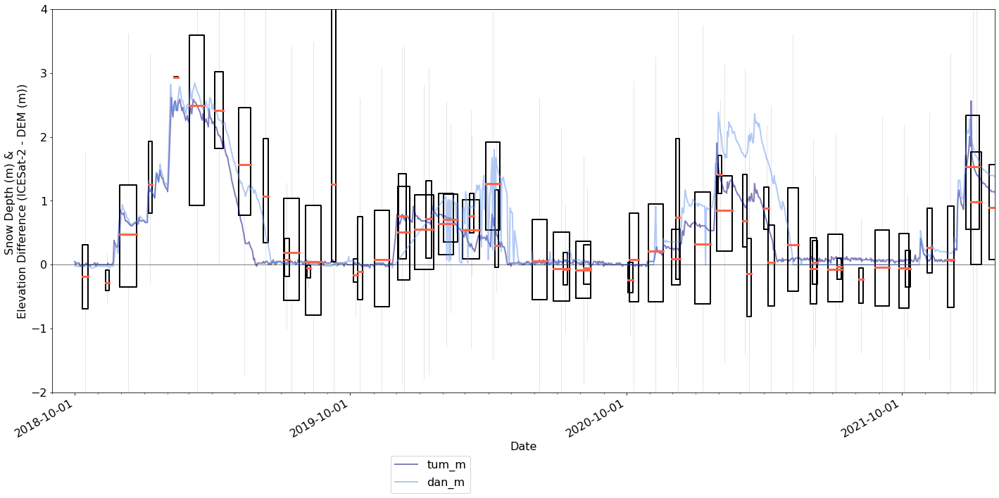

In [78]:
boxplot_date(atl06sr_gdf[atl06_idx], 'diff_plus', clim=(-2,4), name = '../Figures/boxplots_cdec_diffplus_zscore.jpeg')


In [92]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [79]:
snowoff_percent = (len(atl06sr_gdf[atl06sr_gdf['snow_presence'] == 0]) / len(atl06sr_gdf) ) * 100
snowoff_percent

41.16891542105988

In [80]:
snowon_percent = (len(atl06sr_gdf[atl06sr_gdf['snow_presence'] == 1]) / len(atl06sr_gdf) ) * 100
snowon_percent

58.83108457894013

In [81]:
snowoff_percent + snowon_percent

100.0

In [416]:
#atl06sr_crop['diff_plus'] = atl06sr_crop['difference'] + 0.5

# Slope and Aspect Metrics

Still need to figure out how to normalize a windrose plot so that it's easier to visualize differences in results there. The boxplot shows that the median across all aspects is very consistent (~ -0.5) which is consistent with the overall median difference. This tells me that most likely there is not an offset horizontally between the lidar and the ICESat-2 data.  
  
However, the -0.5 m offset vertically tells me that my vertical transformation is likely still off. This might be a result of using the wrong grid? Need to synthesize my vertical transformation methods and check with David about this.

(-5.0, 5.0)

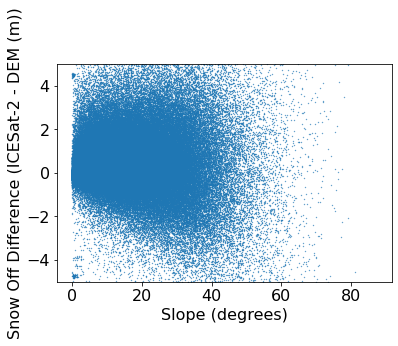

In [82]:
fig, ax = plt.subplots()

ax.scatter(x=atl06sr_gdf['slope_3m'], y = atl06sr_gdf['diff_plus'], s = 0.1)
ax.set_xlabel('Slope (degrees)')
ax.set_ylabel('Snow Off Difference (ICESat-2 - DEM (m))')
ax.set_ylim(-5, 5)

(-5.0, 5.0)

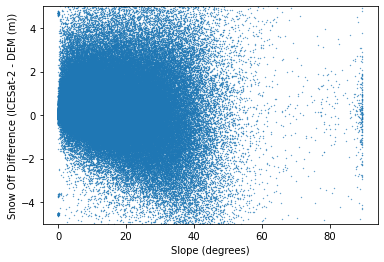

In [275]:
fig, ax = plt.subplots()

ax.scatter(x=atl06sr_gdf['slope_10m'], y = atl06sr_gdf['diff_plus'], s = 0.1)
ax.set_xlabel('Slope (degrees)')
ax.set_ylabel('Snow Off Difference (ICESat-2 - DEM (m))')
ax.set_ylim(-5, 5)

(-5.0, 5.0)

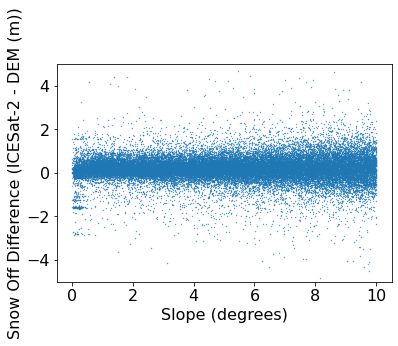

In [274]:
fig, ax = plt.subplots()

ax.scatter(x=atl06sr_lowslope['slope'], y = atl06sr_lowslope['diff_plus'], s = 0.1)
ax.set_xlabel('Slope (degrees)')
ax.set_ylabel('Snow Off Difference (ICESat-2 - DEM (m))')
ax.set_ylim(-5, 5)

In [174]:
#https://datagy.io/pandas-conditional-column/

conditions = [
    (atl06sr_gdf['slope'] <= 10), # below 3k ft elevation (in this case, between 1345 and 3000 ft)
    (atl06sr_gdf['slope'] > 10) & (atl06sr_gdf['slope'] <= 20), # between 3k and 4k ft elevation
    (atl06sr_gdf['slope'] > 20) & (atl06sr_gdf['slope'] <= 30), # between 4k and 5k ft. elevation
    (atl06sr_gdf['slope'] > 30) & (atl06sr_gdf['slope'] <= 40), 
    (atl06sr_gdf['slope'] > 40) & (atl06sr_gdf['slope'] <= 50),
    (atl06sr_gdf['slope'] > 50) & (atl06sr_gdf['slope'] <= 60), 
    (atl06sr_gdf['slope'] > 60) & (atl06sr_gdf['slope'] <= 70),
    (atl06sr_gdf['slope'] > 70) & (atl06sr_gdf['slope'] <= 80),
    (atl06sr_gdf['slope'] > 80)
]
values = [10, 20, 30, 40, 50, 60, 70, 80, 90]
atl06sr_gdf['slope_bins'] = np.select(conditions, values)

In [276]:
#https://datagy.io/pandas-conditional-column/

conditions = [
    (atl06sr_gdf['slope_10m'] <= 10), # below 3k ft elevation (in this case, between 1345 and 3000 ft)
    (atl06sr_gdf['slope_10m'] > 10) & (atl06sr_gdf['slope_10m'] <= 20), # between 3k and 4k ft elevation
    (atl06sr_gdf['slope_10m'] > 20) & (atl06sr_gdf['slope_10m'] <= 30), # between 4k and 5k ft. elevation
    (atl06sr_gdf['slope_10m'] > 30) & (atl06sr_gdf['slope_10m'] <= 40), 
    (atl06sr_gdf['slope_10m'] > 40) & (atl06sr_gdf['slope_10m'] <= 50),
    (atl06sr_gdf['slope_10m'] > 50) & (atl06sr_gdf['slope_10m'] <= 60), 
    (atl06sr_gdf['slope_10m'] > 60) & (atl06sr_gdf['slope_10m'] <= 70),
    (atl06sr_gdf['slope_10m'] > 70) & (atl06sr_gdf['slope_10m'] <= 80),
    (atl06sr_gdf['slope_10m'] > 80)
]
values = [10, 20, 30, 40, 50, 60, 70, 80, 90]
atl06sr_gdf['slope_bins_10m'] = np.select(conditions, values)

In [166]:
#https://datagy.io/pandas-conditional-column/

conditions = [
    (atl06sr_gdf['slope_100m'] <= 10), # below 3k ft elevation (in this case, between 1345 and 3000 ft)
    (atl06sr_gdf['slope_100m'] > 10) & (atl06sr_gdf['slope_100m'] <= 20), # between 3k and 4k ft elevation
    (atl06sr_gdf['slope_100m'] > 20) & (atl06sr_gdf['slope_100m'] <= 30), # between 4k and 5k ft. elevation
    (atl06sr_gdf['slope_100m'] > 30) & (atl06sr_gdf['slope_100m'] <= 40), 
    (atl06sr_gdf['slope_100m'] > 40) & (atl06sr_gdf['slope_100m'] <= 50),
    (atl06sr_gdf['slope_100m'] > 50) & (atl06sr_gdf['slope_100m'] <= 60), 
    (atl06sr_gdf['slope_100m'] > 60) & (atl06sr_gdf['slope_100m'] <= 70),
    (atl06sr_gdf['slope_100m'] > 70) & (atl06sr_gdf['slope_100m'] <= 80),
    (atl06sr_gdf['slope_100m'] > 80)
]
values = [10, 20, 30, 40, 50, 60, 70, 80, 90]
atl06sr_gdf['slope_bins_100m'] = np.select(conditions, values)

In [168]:
atl06sr_gdf.head(2)

,delta_time,w_surface_window_final,dh_fit_dx,spot,segment_id,pflags,h_mean,gt,rms_misfit,h_sigma,...,lidar_z,difference,slope_3m,diff_plus,zscore,slope_10m,slope_100m,platform,site,slope_bins_100m
time,,,,,,,,,,,,,,,,,,,,,
2018-10-15 23:22:20.018965,2.488094e+07,3.0,-0.018228,4,210188,0,2501.377184,30,0.091912,0.033182,...,2501.669922,-0.292738,1.725123,-0.166852,-0.047266,0.962873,NaN,SlideRule,tuolumne,0
2018-10-15 23:22:20.021811,2.488094e+07,3.0,-0.010939,4,210189,0,2501.116873,30,0.109110,0.028329,...,2501.169922,-0.053049,4.888882,0.072837,-0.030189,1.995975,NaN,SlideRule,tuolumne,0


In [280]:
atl06sr_gdf_na = atl06sr_gdf.dropna()

In [282]:
idx = (atl06sr_gdf['doy'] >= snowfree_doy_range[0]) & (atl06sr_gdf['doy'] <= snowfree_doy_range[1])
atl06sr_snowoff = atl06sr_gdf[idx]
atl06sr_snowoff_na = atl06sr_snowoff.dropna()

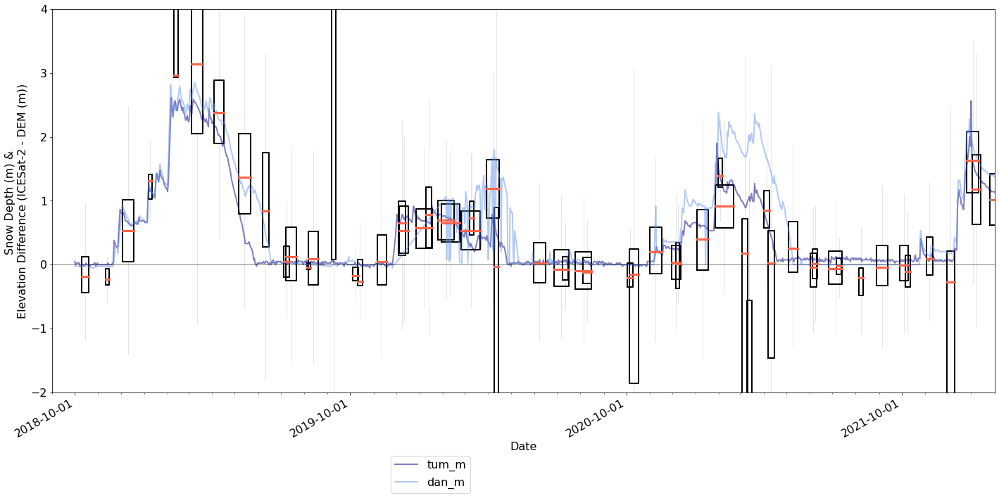

In [169]:
boxplot_date(atl06sr_gdf[atl06sr_gdf['slope_3m']<10], 'diff_plus', clim=(-2,4), name = '../Figures/boxplots_cdec_diffplus_ls3m.jpeg')


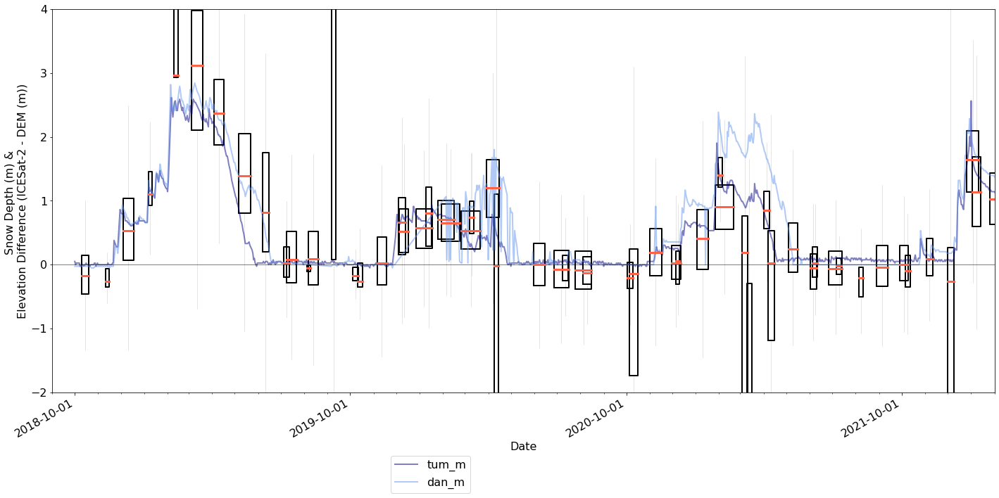

In [170]:
boxplot_date(atl06sr_gdf[atl06sr_gdf['slope_10m']<10], 'diff_plus', clim=(-2,4), name = '../Figures/boxplots_cdec_diffplus_ls10m.jpeg')

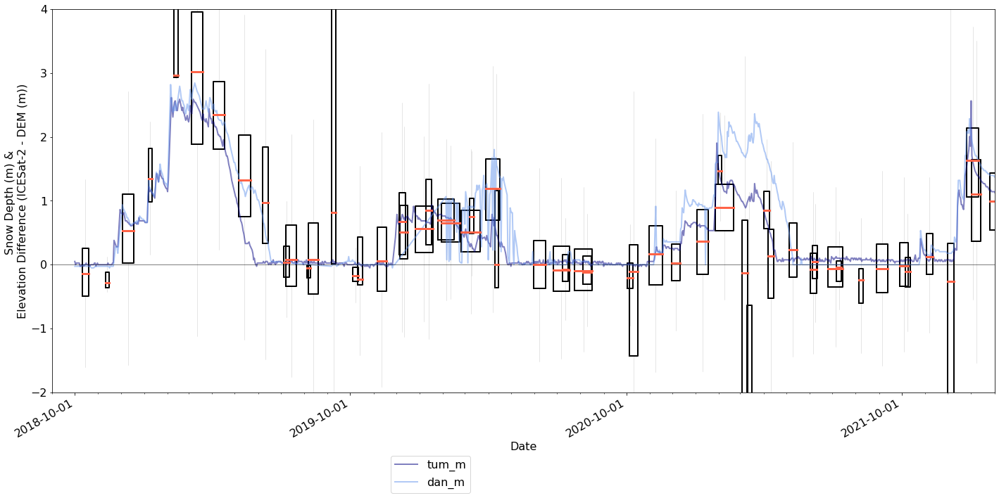

In [171]:
boxplot_date(atl06sr_gdf[atl06sr_gdf['slope_100m']<10], 'diff_plus', clim=(-2,4), name = '../Figures/boxplots_cdec_diffplus_ls100.jpeg')

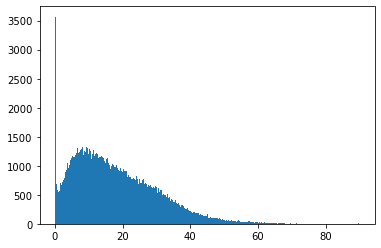

In [212]:
plt.hist(atl06sr_gdf_na['slope'], bins=int(np.sqrt(len(atl06sr_gdf_na))));

In [226]:
import seaborn as sns

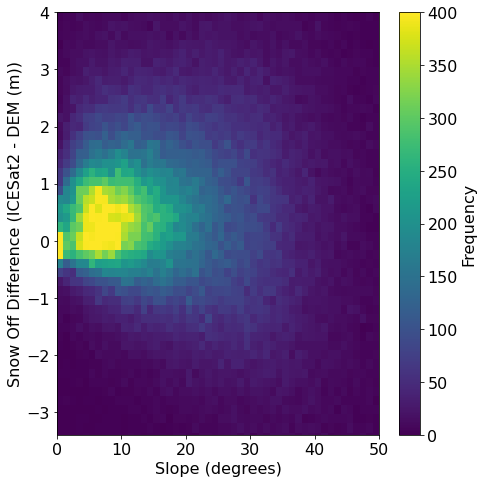

In [190]:
fig, ax = plt.subplots(figsize=(7,7))
c = ax.hist2d(atl06sr_gdf['slope_3m'],atl06sr_gdf['diff_plus'], bins = 50, range = [[0,50], [-4,4]], vmin=0, vmax=400)
plt.xlabel('Slope (degrees)')
plt.ylabel('Snow Off Difference (ICESat2 - DEM (m))')
plt.xlim(0,50)
plt.ylim(-3.4,4)
l = fig.colorbar(c[3], ax=ax,)
l.set_label('Frequency')
plt.tight_layout()
plt.savefig('../figures/slope3m_heatmap.jpeg', dpi=500);

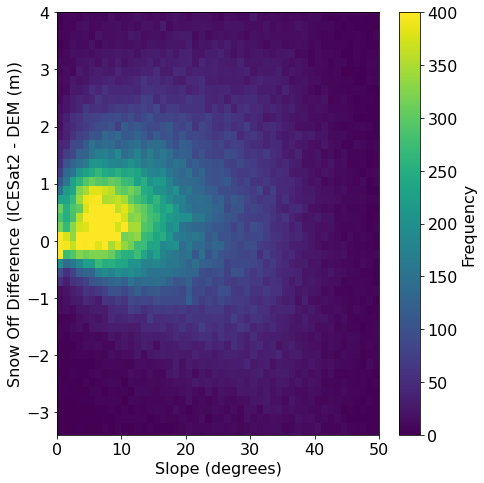

In [191]:
fig, ax = plt.subplots(figsize=(7,7))
c = ax.hist2d(atl06sr_gdf['slope_10m'],atl06sr_gdf['diff_plus'], bins = 50, range = [[0,50], [-4,4]], vmin=0, vmax=400)
plt.xlabel('Slope (degrees)')
plt.ylabel('Snow Off Difference (ICESat2 - DEM (m))')
plt.xlim(0,50)
plt.ylim(-3.4,4)
l = fig.colorbar(c[3], ax=ax,)
l.set_label('Frequency')
plt.tight_layout()
plt.savefig('../figures/slope10m_heatmap.jpeg', dpi=500);

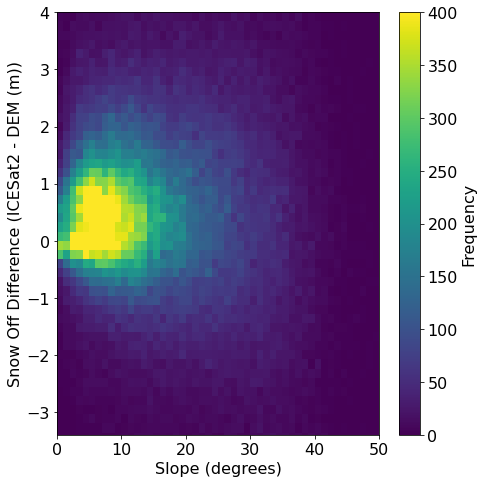

In [192]:
fig, ax = plt.subplots(figsize=(7,7))
c = ax.hist2d(atl06sr_gdf['slope_100m'],atl06sr_gdf['diff_plus'], bins = 50, range = [[0,50], [-4,4]], vmin=0, vmax=400)
plt.xlabel('Slope (degrees)')
plt.ylabel('Snow Off Difference (ICESat2 - DEM (m))')
plt.xlim(0,50)
plt.ylim(-3.4,4)
l = fig.colorbar(c[3], ax=ax,)
l.set_label('Frequency')
plt.tight_layout()
plt.savefig('../figures/slope100m_heatmap.jpeg', dpi=500);

### Elevation Metrics

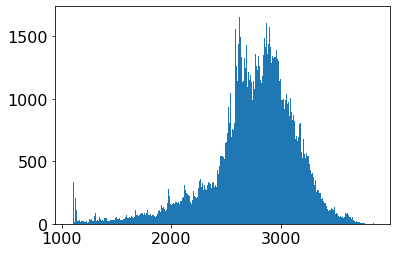

In [193]:
plt.hist(atl06sr_gdf['h_mean'], bins=int(np.sqrt(len(atl06sr_gdf))));

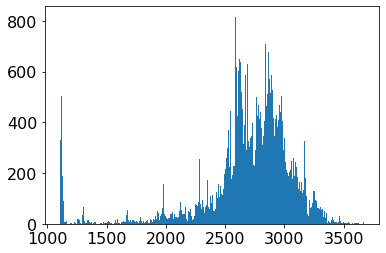

In [195]:
plt.hist(atl06sr_gdf[atl06sr_gdf['slope_3m']<10]['h_mean'], bins=int(np.sqrt(len(atl06sr_gdf))));

(-5.0, 5.0)

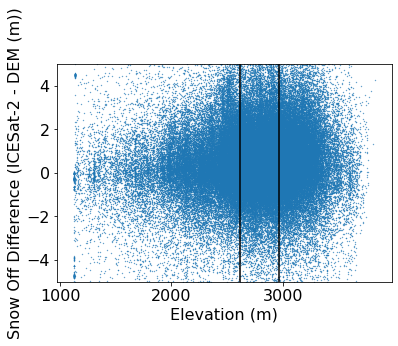

In [213]:
fig, ax = plt.subplots()

ax.scatter(x=atl06sr_gdf['h_mean'], y = atl06sr_gdf['diff_plus'], s = 0.1)

#for elevation in snotel_60km['elevation_transformed']:
ax.axvline(x=tum_elev, c='k')
ax.axvline(x=dan_elev, c='k')

ax.set_xlabel('Elevation (m)')
ax.set_ylabel('Snow Off Difference (ICESat-2 - DEM (m))')
ax.set_ylim(-5, 5)

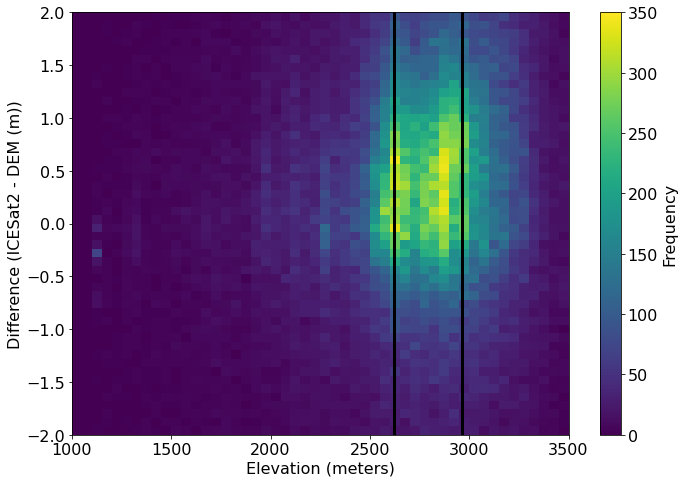

In [208]:
fig, ax = plt.subplots(figsize=(10,7))
#plt.figure(figsize=(7,7))
c = plt.hist2d(x=atl06sr_gdf['h_mean'], y=atl06sr_gdf['diff_plus'], bins=50, range=[[1000,3500],[-2,2]], cmap='viridis', vmin=0, vmax=350) #
#for elevation in snotel_60km['elevation_transformed']:
ax.axvline(x=tum_elev, c='k', linewidth=3)
ax.axvline(x=dan_elev, c='k', linewidth=3)
plt.xlabel('Elevation (meters)')
plt.ylabel('Difference (ICESat2 - DEM (m))')
plt.ylim(-2,2)
l = fig.colorbar(c[3], ax=ax,)
l.set_label('Frequency')
plt.tight_layout()
plt.savefig('../figures/elevation_heatmap_ls.jpeg', dpi=500);

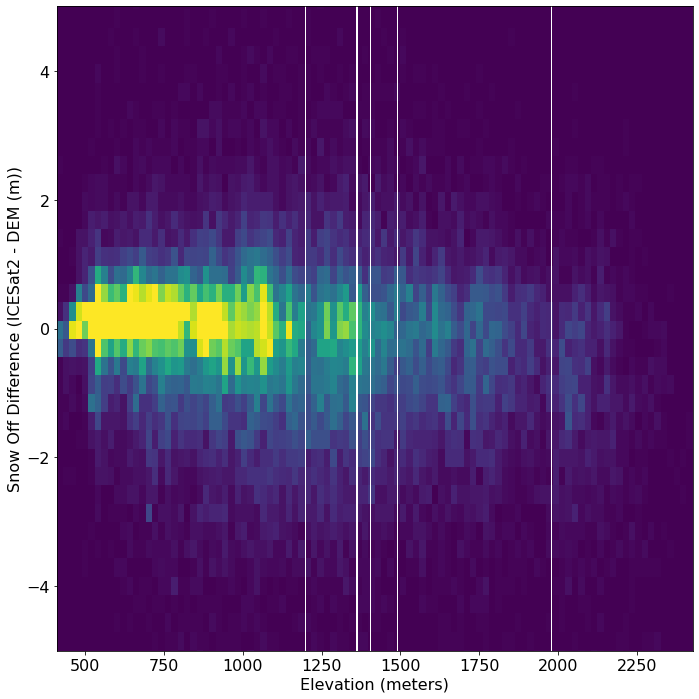

In [305]:
fig, ax = plt.subplots(figsize=(10,10))
#plt.figure(figsize=(7,7))
ax.hist2d(atl06sr_snowoff_na['h_mean'],atl06sr_snowoff_na['diff_plus'], 100, cmap='viridis', vmin=0, vmax=100) #
for elevation in snotel_60km['elevation_transformed']:
    ax.axvline(x=elevation, c='w', linewidth=1)
plt.xlabel('Elevation (meters)')
plt.ylabel('Snow Off Difference (ICESat2 - DEM (m))')
plt.ylim(-5,5)
plt.tight_layout()

In [210]:
clim = np.percentile(atl06sr_crop['difference'].values,(5,95))
atl06sr_crop_95 = atl06sr_crop[atl06sr_crop['difference']<clim[1]]
atl06sr_crop_95_5 = atl06sr_crop_95[atl06sr_crop_95['difference']>clim[0]]

In [211]:
from windrose import WindroseAxes
import matplotlib.cm as cm

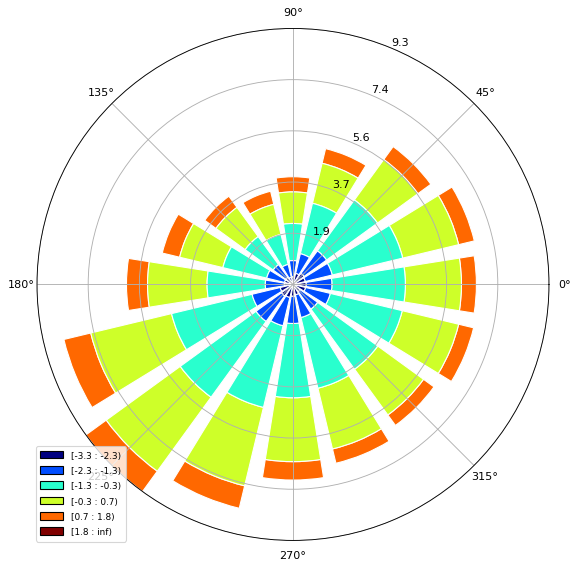

In [320]:
ax = WindroseAxes.from_ax()
ax.bar(atl06sr_crop_95_5.aspect, atl06sr_crop_95_5['difference'], normed=True, opening=0.8, edgecolor='white')
ax.set_legend();

In [321]:
bp_width = atl06sr_crop['difference'].dropna().groupby(atl06sr_crop['bin']).count().values.ravel()
bp_width = bp_width/bp_width.max()

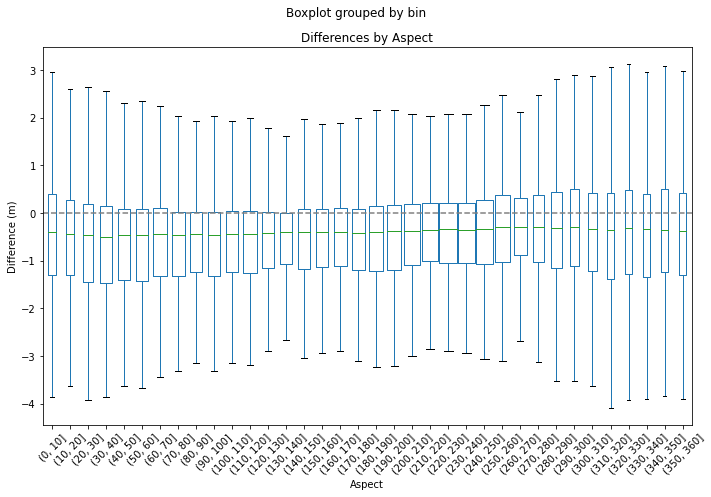

In [324]:
fig, ax = plt.subplots(figsize=(10,7))

atl06sr_crop.boxplot(column=['difference'], by=['bin'], widths=bp_width, grid=False, showfliers=False, ax=ax)
plt.axhline(y=0, color='grey', linestyle='--')
plt.xlabel('Aspect')
plt.xticks(rotation=45)
plt.ylabel('Difference (m)')
#plt.xticks(rotation=45)
plt.title('Differences by Aspect')
plt.tight_layout();

In [216]:
import plotly.express as px

In [239]:
fig = px.bar_polar(atl06sr_crop, r="difference", theta="aspect",color='difference')
#fig.show()

In [243]:
bins = np.arange(0,370,10)

In [244]:
bins

array([  0,  10,  20,  30,  40,  50,  60,  70,  80,  90, 100, 110, 120,
       130, 140, 150, 160, 170, 180, 190, 200, 210, 220, 230, 240, 250,
       260, 270, 280, 290, 300, 310, 320, 330, 340, 350, 360])

In [ ]:
atl06sr_crop['bin'] = atl06sr_crop['aspect'].apply(lambda x: )

In [247]:
atl06sr_crop['bin'] = pd.cut(atl06sr_crop['aspect'],bins)

In [307]:
atl06sr_crop.head()

,distance,dh_fit_dx,n_fit_photons,spot,segment_id,rgt,h_sigma,w_surface_window_final,dh_fit_dy,rms_misfit,...,x,y,doy,decyear,dowy,methow_basin_2018_dtm_combined,difference,diff_plus,aspect,bin
utc,,,,,,,,,,,,,,,,,,,,,
2018-11-09 22:09:43,5.382622e+06,0.077249,18.0,1.0,268429.0,646.0,0.057151,3.000000,0.0,0.171520,...,-1.335849e+07,-1.335849e+07,313,2018.857324,40,863.955383,-2.431104,-1.931104,NaN,NaN
2018-11-09 22:09:43,5.382642e+06,0.100535,24.0,1.0,268430.0,646.0,0.080678,3.000000,0.0,0.315877,...,-1.335849e+07,-1.335849e+07,313,2018.857324,40,863.838684,-0.390651,0.109349,229.590454,"(220.0, 230.0]"
2018-11-09 22:09:43,5.382903e+06,0.028427,41.0,1.0,268443.0,646.0,0.049227,3.000000,0.0,0.293801,...,-1.335852e+07,-1.335852e+07,313,2018.857324,40,922.934387,-3.019799,-2.519799,257.232422,"(250.0, 260.0]"
2018-11-09 22:09:43,5.382943e+06,-0.116346,31.0,1.0,268445.0,646.0,0.046864,3.029198,0.0,0.240594,...,-1.335853e+07,-1.335853e+07,313,2018.857324,40,919.356506,-0.907093,-0.407093,296.122437,"(290.0, 300.0]"
2018-11-09 22:09:43,5.382963e+06,-0.091051,39.0,1.0,268446.0,646.0,0.059177,3.000000,0.0,0.325895,...,-1.335853e+07,-1.335853e+07,313,2018.857324,40,917.574036,-1.186654,-0.686654,287.165161,"(280.0, 290.0]"


In [308]:
atl06sr_crop['bin'].dtype

CategoricalDtype(categories=[(0, 10], (10, 20], (20, 30], (30, 40], (40, 50] ... (310, 320], (320, 330], (330, 340], (340, 350], (350, 360]], ordered=True)

In [316]:
category_sum = []
bin_list = atl06sr_crop['bin'].unique()

for category in atl06sr_crop['bin'].unique():
    category_sum.append(np.sum(atl06sr_crop['bin'] == category))

In [317]:
bin_list

[NaN, (220.0, 230.0], (250.0, 260.0], (290.0, 300.0], (280.0, 290.0], ..., (30, 40], (60, 70], (40, 50], (70, 80], (90, 100]]
Length: 37
Categories (36, interval[int64, right]): [(0, 10] < (10, 20] < (20, 30] < (30, 40] ... (320, 330] < (330, 340] < (340, 350] < (350, 360]]

In [252]:
asp_hist = pd.DataFrame(bins)

In [264]:
asp_hist['freq'] = atl06sr_crop['bin'].value_counts()

In [313]:
counts = atl06sr_crop['bin'].value_counts()

In [314]:
counts

(220, 230]    3398
(230, 240]    3272
(240, 250]    3178
(200, 210]    3065
(210, 220]    3026
(250, 260]    2749
(190, 200]    2716
(180, 190]    2608
(110, 120]    2519
(60, 70]      2482
(160, 170]    2442
(170, 180]    2437
(70, 80]      2431
(80, 90]      2413
(50, 60]      2307
(260, 270]    2301
(100, 110]    2299
(150, 160]    2296
(90, 100]     2278
(130, 140]    2261
(40, 50]      2259
(120, 130]    2241
(140, 150]    2220
(30, 40]      2213
(270, 280]    1984
(20, 30]      1940
(280, 290]    1929
(290, 300]    1783
(10, 20]      1627
(300, 310]    1614
(310, 320]    1502
(0, 10]       1472
(350, 360]    1459
(320, 330]    1430
(340, 350]    1327
(330, 340]    1313
Name: bin, dtype: int64

In [305]:
count = counts.to_frame()

In [306]:
count['bin']

(220, 230]    0.042059
(230, 240]    0.040500
(240, 250]    0.039336
(200, 210]    0.037937
(210, 220]    0.037455
(250, 260]    0.034026
(190, 200]    0.033618
(180, 190]    0.032281
(110, 120]    0.031179
(60, 70]      0.030721
(160, 170]    0.030226
(170, 180]    0.030164
(70, 80]      0.030090
(80, 90]      0.029867
(50, 60]      0.028555
(260, 270]    0.028481
(100, 110]    0.028456
(150, 160]    0.028419
(90, 100]     0.028196
(130, 140]    0.027986
(40, 50]      0.027961
(120, 130]    0.027738
(140, 150]    0.027478
(30, 40]      0.027392
(270, 280]    0.024557
(20, 30]      0.024013
(280, 290]    0.023876
(290, 300]    0.022069
(10, 20]      0.020138
(300, 310]    0.019977
(310, 320]    0.018591
(0, 10]       0.018220
(350, 360]    0.018059
(320, 330]    0.017700
(340, 350]    0.016425
(330, 340]    0.016252
Name: bin, dtype: float64

In [277]:
count_order = count.sort_index()

In [300]:
count_order['bin'][0].dtype

dtype('int64')

In [285]:
asp_hist['freq'] = count_order['bin']

In [295]:
count_order['index'] = asp_hist[0]

In [302]:
type(count_order.index)

pandas.core.indexes.category.CategoricalIndex

In [222]:
def pol2cart(rho, phi, rotate):
    # given a point's polar coordinates rho (radial distance), phi (clockwise azimuth angle), 
    # and rotate (angle to add to phi to put 0 degrees at the top like a compass)
    #https://stackoverflow.com/questions/20924085/python-conversion-between-coordinates
    x = rho * np.cos(np.radians(-phi+rotate))
    y = rho * np.sin(np.radians(-phi+rotate))
    return(x, y)

In [224]:
aspect_x, aspect_y = pol2cart(atl06sr_crop_95_5['difference'], atl06sr_crop_95_5.aspect, 0)

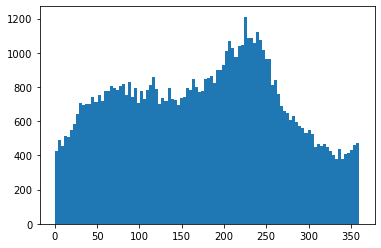

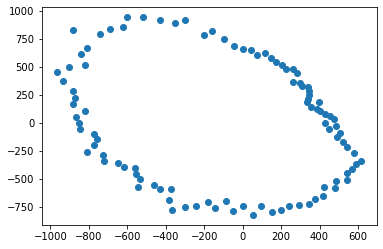

In [231]:
aspect_hist = plt.hist(atl06sr_crop_95_5.aspect.values.ravel(), bins=100)

aspect_x, aspect_y = pol2cart(aspect_hist[0],aspect_hist[1][:-1],0)

plt.figure()
plt.scatter(aspect_x, aspect_y, cmap=atl06sr_crop_95_5['difference'])

In [238]:
aspect_hist[0]

array([ 427.,  488.,  453.,  513.,  506.,  547.,  584.,  640.,  704.,
        697.,  702.,  701.,  744.,  710.,  754.,  716.,  779.,  778.,
        808.,  796.,  780.,  807.,  815.,  753.,  827.,  744.,  795.,
        707.,  775.,  730.,  785.,  811.,  861.,  791.,  698.,  736.,
        720.,  794.,  731.,  723.,  692.,  734.,  740.,  797.,  784.,
        849.,  800.,  773.,  779.,  846.,  851.,  867.,  826.,  897.,
        899.,  929., 1008., 1068., 1030.,  973., 1040., 1048., 1211.,
       1085., 1085., 1056., 1119., 1077., 1015.,  962.,  964.,  813.,
        840.,  759.,  690.,  662.,  650.,  608.,  632.,  595.,  569.,
        559.,  533.,  548.,  525.,  449.,  466.,  454.,  464.,  449.,
        426.,  400.,  381.,  437.,  381.,  409.,  414.,  434.,  460.,
        475.])

## Cut from above so slope and elevation metrics happen earlier

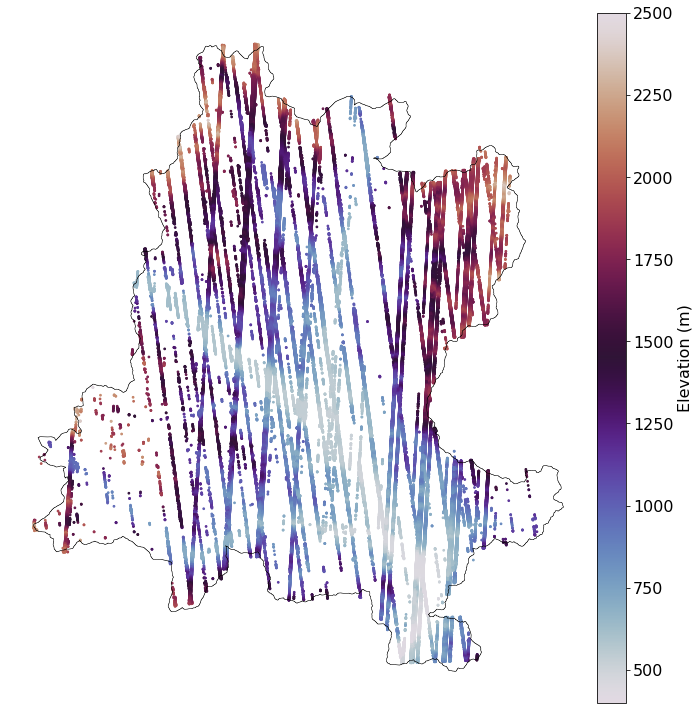

In [479]:
fig, ax = plt.subplots(figsize=(10,15))

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

atl06sr_gdf.plot(ax=ax, column='h_mean', cmap='twilight', legend=True, cax=cax, legend_kwds={'label': "Elevation (m)"}, vmin = 400, vmax = 2500, s=3)
dnr_gdf.iloc[0:1].plot(facecolor='None', edgecolor='k', lw=0.5, ax=ax)

ax.set_axis_off()

plt.tight_layout()
plt.savefig('figures/atl06sr_tracks.jpeg', dpi=500)

In [513]:
atl06sr_gdf.columns

Index(['distance', 'dh_fit_dx', 'gt', 'spot', 'w_surface_window_final',
       'h_mean', 'dh_fit_dy', 'n_fit_photons', 'pflags', 'cycle', 'h_sigma',
       'rgt', 'rms_misfit', 'delta_time', 'segment_id', 'geometry', 'acqdate',
       'x', 'y', 'doy', 'decyear', 'dowy', 'lidar_z', 'difference',
       'diff_plus'],
      dtype='object')

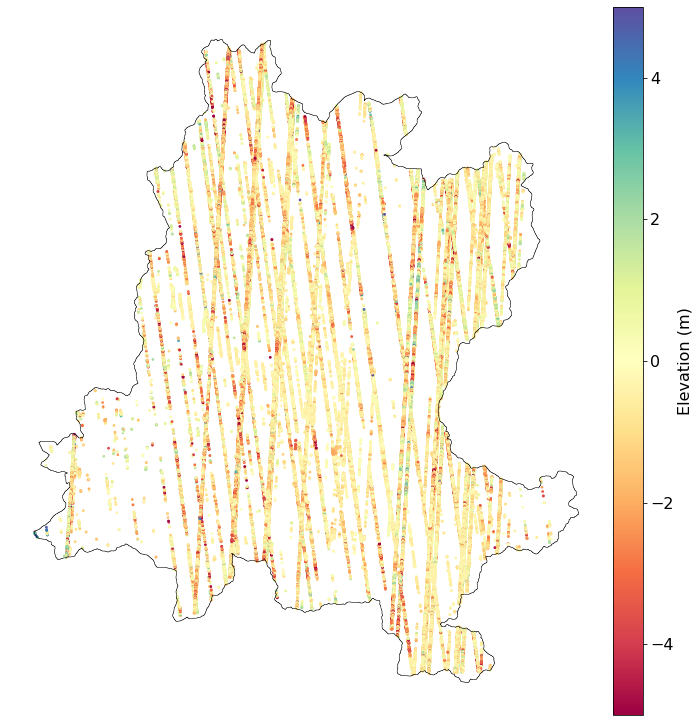

In [519]:
fig, ax = plt.subplots(figsize=(10,15))

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

atl06sr_gdf.plot(ax=ax, column='difference', cmap='Spectral', legend=True, cax=cax, legend_kwds={'label': "Elevation (m)"}, vmin=-5, vmax=5,s=3)
dnr_gdf.iloc[0:1].plot(facecolor='None', edgecolor='k', lw=0.5, ax=ax)

ax.set_axis_off()

plt.tight_layout()
plt.savefig('figures/atl06sr_difference.jpeg', dpi=500)

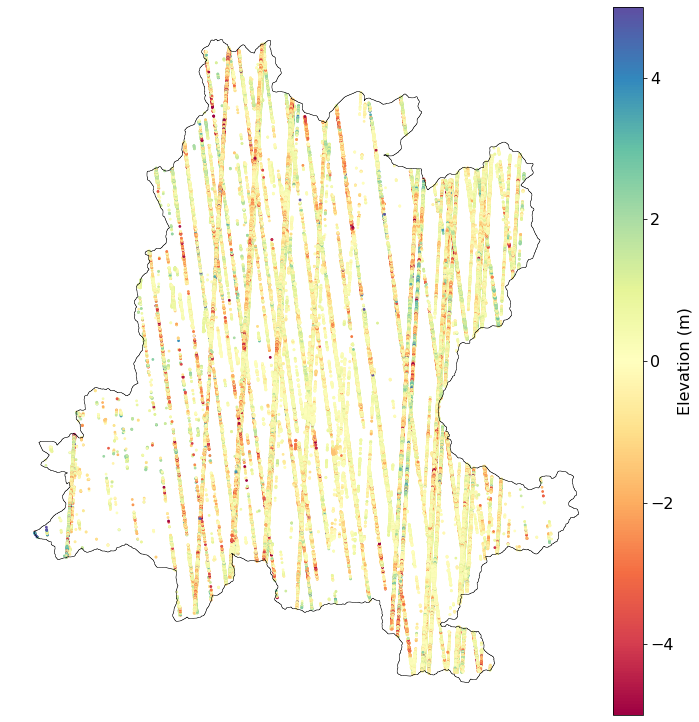

In [520]:
fig, ax = plt.subplots(figsize=(10,15))

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

atl06sr_gdf.plot(ax=ax, column='diff_plus', cmap='Spectral', legend=True, cax=cax, legend_kwds={'label': "Elevation (m)"}, vmin=-5, vmax=5,s=3)
dnr_gdf.iloc[0:1].plot(facecolor='None', edgecolor='k', lw=0.5, ax=ax)

ax.set_axis_off()

plt.tight_layout()
plt.savefig('figures/atl06sr_diffplus.jpeg', dpi=500)

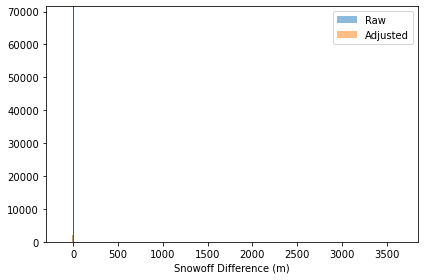

In [255]:
fig, ax = plt.subplots()

#atl06sr_gdf['difference'].hist(bins=100, range=(-10,10))
ax.hist(atl06sr_snowoff['difference'], alpha=0.5, bins=int(np.sqrt(len(atl06sr_snowoff))), label='Raw')
ax.hist(atl06sr_snowoff['diff_plus'], alpha=0.5, bins=int(np.sqrt(len(atl06sr_snowoff))), label='Adjusted')
#ax.set_xlim(-5,5)
ax.set_xlabel('Snowoff Difference (m)')
ax.axvline(x = np.nanmedian(atl06sr_snowoff['difference']), c='navy', linewidth=1)
ax.axvline(x = np.nanmedian(atl06sr_snowoff['diff_plus']), c='saddlebrown', linewidth=1)
plt.legend()

plt.tight_layout()
plt.savefig('../Figures/Difference_histogram.jpeg', dpi=500)

In [551]:
atl06sr_snowoff['difference'].describe()

count    39455.000000
mean        -0.684958
std          1.182846
min        -13.128608
25%         -1.179780
50%         -0.474113
75%         -0.109451
max         15.269414
Name: difference, dtype: float64

In [256]:
lidar_coarse = '../data/lidar/snow_off/ASO_snowoff_linux/mcc_dem_3p0m_agg_TUOtrimmed_MANUAL_10m.tif'

In [258]:
src = rio.open(lidar_coarse)
coarse = src.read(1)

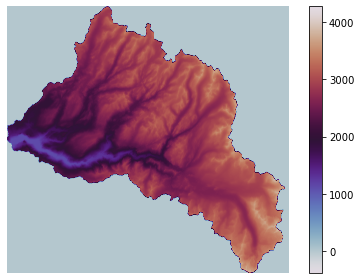

In [261]:
fig, ax = plt.subplots()
c = plt.imshow(coarse, cmap='twilight') #, vmin = 400, vmax = 2500
ax.set_axis_off()
plt.tight_layout()
plt.colorbar(c)
plt.savefig('../Figures/lidar_10m.jpeg', dpi=500);

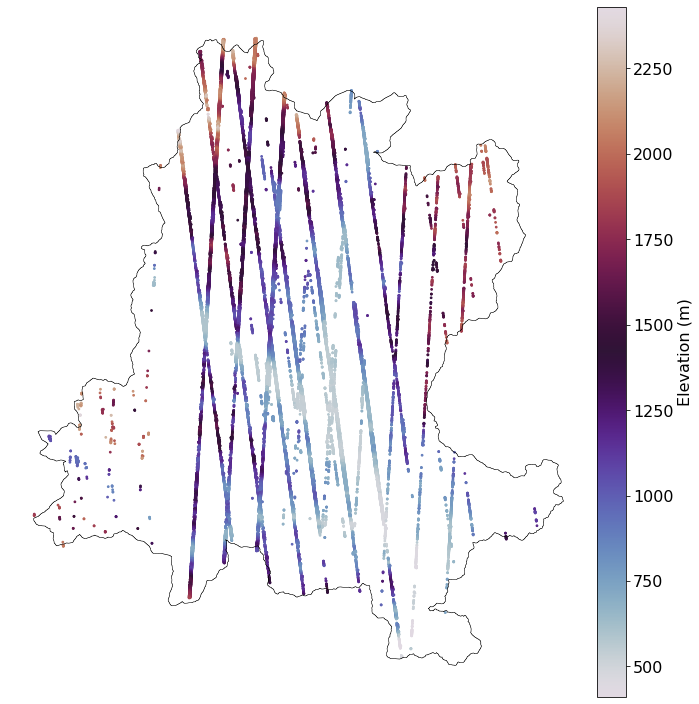

In [482]:
fig, ax = plt.subplots(figsize=(10,15))

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

atl06sr_snowoff.plot(ax=ax, column='h_mean', cmap='twilight', legend=True, cax=cax, legend_kwds={'label': "Elevation (m)"}, s=3)
dnr_gdf.iloc[0:1].plot(facecolor='None', edgecolor='k', lw=0.5, ax=ax)

ax.set_axis_off();

plt.tight_layout()
plt.savefig('figures/atl06sr_snowoff_tracks.jpeg', dpi=500)

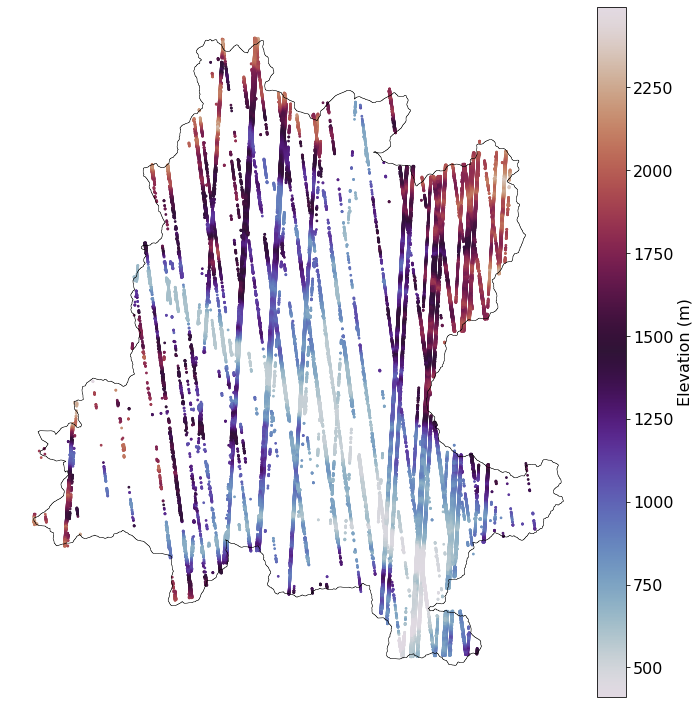

In [491]:
fig, ax = plt.subplots(figsize=(10,15))

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

atl06sr_gdf[~idx].plot(ax=ax, column='h_mean', cmap='twilight', legend=True, cax=cax, legend_kwds={'label': "Elevation (m)"}, s=3)
dnr_gdf.iloc[0:1].plot(facecolor='None', edgecolor='k', lw=0.5, ax=ax)

ax.set_axis_off();

plt.tight_layout()
plt.savefig('figures/atl06sr_snowon_tracks.jpeg', dpi=500)

In [415]:
atl06sr_gdf.diff_plus.describe()

count    1.343850e+05
mean    -1.329745e-01
std      1.176208e+00
min     -1.808369e+01
25%     -6.263098e-01
50%     -3.184173e-07
75%      4.647819e-01
max      1.564801e+01
Name: diff_plus, dtype: float64

# Elevation Metrics

## Pull Snotel Data At Different Elevation Bands

#### Elevations in this region span 1345 to 6545 ft. I will separate these into elevation bands:  
* 1345-3000 ft = 914.4 m,  
* 3001 - 4000 = 1219.2 m,  
* 4001-5000 = 1524 m,  
* 5001-6000 = 1828.8 m,  
* 6000-7000 = 2133.6 m

In [557]:
snotel_60km['elevation_ft'] = snotel_60km['elevation_m'] * 3.28

In [558]:
elev_thresholds = [3000, 4000, 5000, 6000] #feet

snotel_60km_2k = snotel_60km[snotel_60km['elevation_ft'] < elev_thresholds[0]]
#print(snotel_60km_2k)

snotel_60km_3k = snotel_60km[(snotel_60km['elevation_ft'] < elev_thresholds[1]) & (snotel_60km['elevation_ft'] > elev_thresholds[0])]
#print(snotel_60km_3k)

snotel_60km_4k = snotel_60km[(snotel_60km['elevation_ft'] < elev_thresholds[2]) & (snotel_60km['elevation_ft'] > elev_thresholds[1])]
#print(snotel_60km_4k)

snotel_60km_5k = snotel_60km[(snotel_60km['elevation_ft'] < elev_thresholds[3]) & (snotel_60km['elevation_ft'] > elev_thresholds[2])]
#print(snotel_60km_5k)

snotel_60km_6k = snotel_60km[(snotel_60km['elevation_ft'] > elev_thresholds[3])]
#print(snotel_60km_6k)

In [563]:
# SNOTEL sites with a 60km radius of the Methow

pkl_fns = ['snotel_snwd_d_2k.pkl', 'snotel_snwd_d_3k.pkl', 'snotel_snwd_d_4k.pkl', 'snotel_snwd_d_5k.pkl', 'snotel_snwd_d_6k.pkl']
gdfs = [snotel_60km_2k, snotel_60km_3k, snotel_60km_4k, snotel_60km_5k, snotel_60km_6k]
dfs = {}

#for x in range(0, len(pkl_fns)):
for pkl_fn, gdf, x in zip(pkl_fns, gdfs, range(0,len(pkl_fns))):
    if os.path.exists(pkl_fn):
        dfs[x] = pd.read_pickle(pkl_fn)
    else:
        #Define an empty dictionary to store returns for each site
        value_dict = {}
        for i, sitecode in enumerate(gdf.index):
            print('%i of %i sites' % (i+1, len(gdf.index)) )
            #out = fetch(sitecode, variablecode, start_date, end_date)
            out = snotel_fetch(sitecode, variablecode)
            if out is not None:
                value_dict[sitecode] = out['value']
        #Convert the dictionary to a DataFrame, automatically handles different datetime ranges (nice!)
        dfs[x] = pd.DataFrame.from_dict(value_dict)
        dfs[x] = (dfs[x]*2.54)/100
        #Write out
        print(f"Writing out: {pkl_fn}")
        dfs[x].to_pickle(pkl_fn)

1 of 1 sites
Writing out: snotel_snwd_d_3k.pkl
1 of 5 sites
2 of 5 sites
3 of 5 sites
4 of 5 sites
5 of 5 sites
Writing out: snotel_snwd_d_4k.pkl
1 of 1 sites


Unable to fetch SNOTEL:SNWD_D
Writing out: snotel_snwd_d_5k.pkl
1 of 1 sites
Writing out: snotel_snwd_d_6k.pkl


In [565]:
atl06sr_gdf.head()

,distance,dh_fit_dx,gt,spot,w_surface_window_final,h_mean,dh_fit_dy,n_fit_photons,pflags,cycle,h_sigma,rgt,rms_misfit,delta_time,segment_id,geometry,acqdate,x,y,doy,decyear,dowy,lidar_z,difference,diff_plus
time,,,,,,,,,,,,,,,,,,,,,,,,,
2018-11-09 22:09:43.662998,5.382001e+06,0.367318,20,1,9.386548,774.110259,0.0,41,0,1,0.079705,646,0.506044,2.703658e+07,268398,POINT (722265.057 5358346.501),2018-11-09,-120.000526,48.339165,313,2018.857324,40,NaN,NaN,NaN
2018-11-09 22:09:43.789001,5.382903e+06,0.028568,20,1,3.000000,919.941824,0.0,42,0,1,0.050617,646,0.305572,2.703658e+07,268443,POINT (722145.580 5359238.959),2018-11-09,-120.001665,48.347225,313,2018.857324,40,921.263184,-1.321359,-0.847246
2018-11-09 22:09:43.794998,5.382943e+06,-0.116342,20,1,3.029108,918.460968,0.0,31,0,1,0.046853,646,0.240537,2.703658e+07,268445,POINT (722140.182 5359280.079),2018-11-09,-120.001716,48.347597,313,2018.857324,40,920.253967,-1.792999,-1.318886
2018-11-09 22:09:43.798000,5.382963e+06,-0.091024,20,1,3.000000,916.399163,0.0,39,0,1,0.059160,646,0.325805,2.703658e+07,268446,POINT (722137.582 5359299.951),2018-11-09,-120.001741,48.347776,313,2018.857324,40,916.869568,-0.470405,0.003708
2018-11-09 22:09:43.799999,5.382983e+06,-0.027886,20,1,3.000000,915.721672,0.0,40,0,1,0.038990,646,0.245902,2.703658e+07,268447,POINT (722134.962 5359319.820),2018-11-09,-120.001766,48.347955,313,2018.857324,40,917.229431,-1.507760,-1.033647


In [566]:
#https://datagy.io/pandas-conditional-column/

conditions = [
    (atl06sr_gdf['lidar_z'] < 914.4), # below 3k ft elevation (in this case, between 1345 and 3000 ft)
    (atl06sr_gdf['lidar_z'] >= 914.4) & (atl06sr_gdf['lidar_z'] < 1219.2), # between 3k and 4k ft elevation
    (atl06sr_gdf['lidar_z'] >= 1219.2) & (atl06sr_gdf['lidar_z'] < 1524), # between 4k and 5k ft. elevation
    (atl06sr_gdf['lidar_z'] >= 1524) & (atl06sr_gdf['lidar_z'] < 1828.8), # between 5k and 6k ft elevation
    (atl06sr_gdf['lidar_z'] >= 1828.8) # above 6k ft elevation (highest point is below 7k)
]
values = [2000, 3000, 4000, 5000, 6000]
atl06sr_gdf['elevation_band'] = np.select(conditions, values)

In [338]:
#atl06sr_gdf.index = atl06sr_gdf.index.to_period('D')

In [341]:
#atl06sr_crop['date'] = atl06sr_crop.index

In [342]:
bp_stats = atl06sr_gdf.loc[atl06sr_crop['elevation_band'] == 3000][['difference', 'date']].dropna().groupby('date').apply(cbook.boxplot_stats)

In [343]:
loc = 'elevation_band'
loc_list = [3000, 4000, 6000]
df = atl06sr_crop
col='difference'
groupby_col='date'
bp_stats = df.loc[df[loc] == (loc_list[i] for i in loc_list)][[col, groupby_col]].dropna().groupby(groupby_col).apply(cbook.boxplot_stats)

In [567]:
def boxplot_date_elevation(df, loc, loc_list, col, groupby_col='date', clim=(-5, 5)):
    bp_stats = df.loc[df[loc] == 
    (loc_list[i] for i in loc_list)][[col, groupby_col]].dropna().groupby(groupby_col).apply(cbook.boxplot_stats)
    bp_stats_list = [i[0] for i in bp_stats.values]
    bp_width = df.loc[df[loc] == (loc_list[i] for i in loc_list)][[col, groupby_col]].dropna().groupby(groupby_col).count().values.ravel()
    bp_width = 20*bp_width/bp_width.max()+5
    pos = (pd.to_datetime(bp_stats.index) - pd.to_datetime(mpl_epoch)).days.values
    
    f, ax = plt.subplots(1,3, figsize=(10,5))
    bxp_f = ax[0].bxp(bp_stats_list, positions=pos, showfliers=False, showcaps=False, whiskerprops={'lw':0.5, 'alpha':0.2}, widths=bp_width)
    
    snwd_df_m.plot(ax=ax, lw=0.5, style=['--','-'])
    
    ax.axhline(0, color='k', lw=0.5)
    ax.set_ylabel('Elevation difference (m)')
    ax.set_ylim(*clim)
    #ax.set_xlim([dt_min_plot, dt_max_plot])
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    
    years = mdates.YearLocator(month=10)
    ax.format_xdata = mdates.DateFormatter('%Y-%m-%d')
    years_fmt = mdates.DateFormatter('%Y-%m-%d')
    ax.xaxis.set_major_locator(years)
    ax.xaxis.set_major_formatter(years_fmt)
    months = mdates.MonthLocator()
    ax.xaxis.set_minor_locator(months)

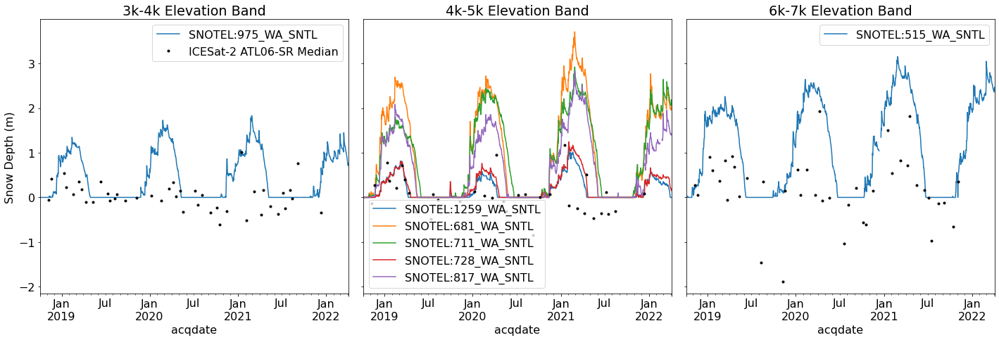

In [578]:
fig, ax = plt.subplots(1,3, figsize=(20, 7), sharey=True)

dfs[1].plot(ax=ax[0])
dfs[2].plot(ax=ax[1])
dfs[4].plot(ax=ax[2])

atl06sr_gdf['diff_plus'].loc[atl06sr_gdf['elevation_band'] == 
    3000].groupby(atl06sr_gdf.loc[atl06sr_gdf['elevation_band'] == 
        3000].acqdate).median().plot(ax=ax[0], 
            color='k', marker='.', linestyle='none', 
                label = 'ICESat-2 ATL06-SR Median') 

atl06sr_gdf['diff_plus'].loc[atl06sr_gdf['elevation_band'] == 
    4000].groupby(atl06sr_gdf.loc[atl06sr_gdf['elevation_band'] == 
        4000].acqdate).median().plot(ax=ax[1], 
            color='k', marker='.', linestyle='none') 

atl06sr_gdf['diff_plus'].loc[atl06sr_gdf['elevation_band'] == 
    6000].groupby(atl06sr_gdf.loc[atl06sr_gdf['elevation_band'] == 
        6000].acqdate).median().plot(ax=ax[2], 
            color='k', marker='.', linestyle='none'
               ) 

ax[0].set_ylabel('Snow Depth (m)')

ax[0].legend()
#ax[1].legend(loc = 'upper left')
#ax[2].legend(loc='best')

ax[0].set_title('3k-4k Elevation Band')
ax[1].set_title('4k-5k Elevation Band')
ax[2].set_title('6k-7k Elevation Band')
plt.tight_layout()
plt.savefig('snotel_elevation.jpeg', dpi=500);
#atl08_methow_95_5['difference_cm'][atl08_methow_95_5['elevation_band'] == 3000].groupby(atl08_methow_95_5.index).median().plot(ax=ax)

## Sample DEM metrics: Will keep, but don't need to run yet.
I'll save this for once I'm trying to figure out differences between sites.

In [102]:
dem_fn = aso_fn_list[aso_idx]

In [103]:
dem_fn

'ASO/ASO_3M_PCDTM_USCOGM_20160926_20160926.tif'

In [579]:
dnr_fn

'../datasetsA/methow_basin_2018/dtm/raw/methow_basin_2018_dtm_combined_32610_1m.tif'

In [582]:
# Expects there to be tiffs in the folder with suffixes slope, tri, and roughness.

for v in ['slope', 'tri', 'roughness']:
    #gdaldem_fn = os.path.splitext(aso_fn_list[aso_idx])[0]+f'_{v}.tif'
    gdaldem_fn = os.path.splitext(dnr_fn)[0]+f'_{v}.tif'
    print(gdaldem_fn)
    !gdaldem {v} {dnr_fn} {gdaldem_fn} -co COMPRESS=LZW BIGTIFF=YES -co TILED=YES 
    gdaldem_src = rio.open(gdaldem_fn)
    sample_raster(atl06sr_gdf, gdaldem_src)

../datasetsA/methow_basin_2018/dtm/raw/methow_basin_2018_dtm_combined_32610_1m_slope.tif
ERROR 6: Too many command options 'BIGTIFF=YES'
 Usage: 
 - To generate a shaded relief map from any GDAL-supported elevation raster : 

     gdaldem hillshade input_dem output_hillshade 
                 [-z ZFactor (default=1)] [-s scale* (default=1)] 
                 [-az Azimuth (default=315)] [-alt Altitude (default=45)]
                 [-alg ZevenbergenThorne] [-combined | -multidirectional | -igor]
                 [-compute_edges] [-b Band (default=1)] [-of format] [-co "NAME=VALUE"]* [-q]

 - To generates a slope map from any GDAL-supported elevation raster :

     gdaldem slope input_dem output_slope_map 
                 [-p use percent slope (default=degrees)] [-s scale* (default=1)]
                 [-alg ZevenbergenThorne]
                 [-compute_edges] [-b Band (default=1)] [-of format] [-co "NAME=VALUE"]* [-q]

 - To generate an aspect map from any GDAL-supported elevation rast

RasterioIOError: ../datasetsA/methow_basin_2018/dtm/raw/methow_basin_2018_dtm_combined_32610_1m_slope.tif: No such file or directory

In [585]:
!gdaldem slope '../datasetsA/methow_basin_2018/dtm/raw/methow_basin_2018_dtm_combined_32610_1m.tif' '../datasetsA/methow_basin_2018/dtm/raw/methow_basin_2018_dtm_combined_32610_1m_slope.tif' -co COMPRESS=LZW -co TILED=YES -co BIGTIFF=YES

0...10...20...30...40...50...60...70...80...90...100 - done.


In [586]:
!gdaldem roughness '../datasetsA/methow_basin_2018/dtm/raw/methow_basin_2018_dtm_combined_32610_1m.tif' '../datasetsA/methow_basin_2018/dtm/raw/methow_basin_2018_dtm_combined_32610_1m_roughness.tif' -co COMPRESS=LZW -co TILED=YES -co BIGTIFF=YES

0...10...20...30...40...50...60...70...80...90...100 - done.


In [587]:
slope_src = rio.open('../datasetsA/methow_basin_2018/dtm/raw/methow_basin_2018_dtm_combined_32610_1m_slope.tif')
sample_raster(atl06sr_gdf, slope_src)

'methow_basin_2018_dtm_combined_32610_1m_slope'

In [588]:
slope_src.close

<function DatasetReader.close>

In [589]:
roughness_src = rio.open('../datasetsA/methow_basin_2018/dtm/raw/methow_basin_2018_dtm_combined_32610_1m_roughness.tif')
sample_raster(atl06sr_gdf, roughness_src)
roughness_src.close

<function DatasetReader.close>

In [ ]:
for v in ['slope', 'tri', 'roughness']:
    #gdaldem_fn = os.path.splitext(aso_fn_list[aso_idx])[0]+f'_{v}.tif'
    gdaldem_fn = os.path.splitext(dnr_fn)[0]+f'_{v}.tif'
    print(gdaldem_fn)
    !gdaldem {v} {dnr_fn} {gdaldem_fn} -co COMPRESS=LZW BIGTIFF=YES -co TILED=YES 
    gdaldem_src = rio.open(gdaldem_fn)
    sample_raster(atl06sr_gdf, gdaldem_src)

In [200]:
atl06sr_crop.columns

Index(['geometry', 'cycle', 'delta_time', 'dh_fit_dx', 'dh_fit_dy', 'distance',
       'gt', 'h_mean', 'h_sigma', 'n_fit_photons', 'pflags', 'rgt',
       'rms_misfit', 'segment_id', 'spot', 'w_surface_window_final', 'acqdate',
       'x', 'y', 'doy', 'decyear', 'dowy',
       'ASO_3M_PCDTM_USCOGM_20160926_20160926',
       'h_mean ASO_3M_PCDTM_USCOGM_20160926_20160926 diff',
       'ASO_3M_PCDTM_USCOGM_20160926_20160926_8x_slope',
       'ASO_3M_PCDTM_USCOGM_20160926_20160926_8x_tri',
       'ASO_3M_PCDTM_USCOGM_20160926_20160926_8x_roughness'],
      dtype='object')

In [194]:
gdaldem_fn = os.path.splitext(dem_fn)[0]+f'_slope.tif'
gdaldem_src = rio.open(gdaldem_fn)
gdaldem = gdaldem_src.read(1, masked=True)

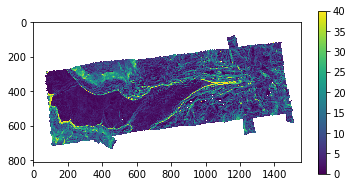

In [199]:
f, ax = plt.subplots(figsize=(6,3))
m = ax.imshow(gdaldem, vmin=0, vmax=40)
f.colorbar(m)

In [201]:
import rioxarray

In [202]:
ds = rioxarray.open_rasterio(gdaldem_fn, masked=True)

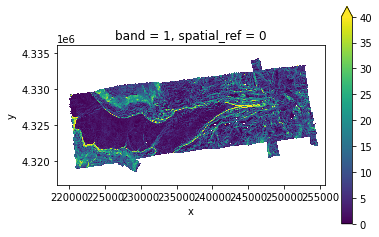

In [204]:
ax = ds.squeeze().plot.imshow(vmin=0, vmax=40)
ax.axes.set_aspect('equal')

In [205]:
atl08_slope_col = 'ASO_3M_PCDTM_USCOGM_20160926_20160926_8x_slope'

<AxesSubplot:>

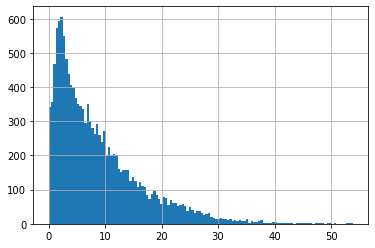

In [232]:
atl08_crop[atl08_slope_col].hist(bins=128)

<AxesSubplot:>

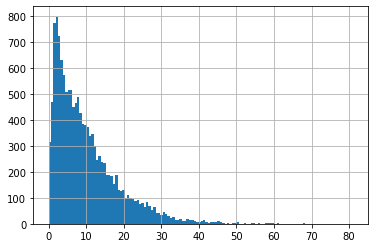

In [234]:
atl08_crop['ASO_3M_PCDTM_USCOGM_20160926_20160926_8x_tri'].hist(bins=128)

(0.0, 40.0)

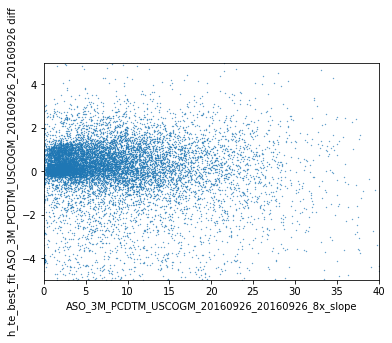

In [228]:
col1 = atl08_slope_col
col2 = atl08_diff_col
ax = atl08_crop.plot(kind='scatter', x=col1, y=col2, s=0.1)
ax.set_ylim(-5, 5)
ax.set_xlim(0, 40)

(0.0, 40.0)

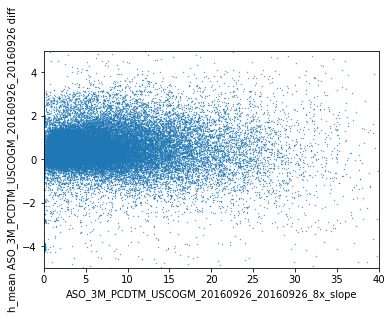

In [229]:
col1 = atl08_slope_col
col2 = atl06sr_diff_col
ax = atl06sr_crop.plot(kind='scatter', x=col1, y=col2, s=0.1)
ax.set_ylim(-5, 5)
ax.set_xlim(0, 40)

(0.0, 10.0)

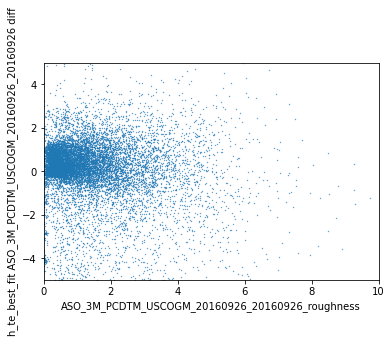

In [162]:
col1 = 'ASO_3M_PCDTM_USCOGM_20160926_20160926_roughness'
col2 = atl08_diff_col
ax = atl08_crop.plot(kind='scatter', x=col1, y=col2, s=0.1)
ax.set_ylim(-5, 5)
ax.set_xlim(0, 10)

In [163]:
atl08_crop.columns

Index(['segment_id_beg', 'segment_id_end', 'delta_time', 'latitude',
       'longitude', 'brightness_flag', 'layer_flag', 'msw_flag', 'night_flag',
       'terrain_flg', 'urban_flag', 'segment_landcover', 'segment_snowcover',
       'segment_watermask', 'h_te_best_fit', 'h_te_uncertainty',
       'terrain_slope', 'n_te_photons', 'h_canopy', 'h_canopy_uncertainty',
       'canopy_flag', 'n_ca_photons', 'rgt', 'cycle', 'groundtrack_id',
       'atlas_spot_number', 'atlas_beam_type', 'sc_orientation',
       'atmosphere_profile', 'atlas_pce', 'decyear', 'x', 'y', 'doy', 'dowy',
       'geometry', 'acqdate', 'platform',
       'ASO_3M_PCDTM_USCOGM_20160926_20160926',
       'h_te_best_fit ASO_3M_PCDTM_USCOGM_20160926_20160926 diff',
       'ASO_3M_PCDTM_USCOGM_20160926_20160926_slope',
       'ASO_3M_PCDTM_USCOGM_20160926_20160926_tri',
       'ASO_3M_PCDTM_USCOGM_20160926_20160926_roughness'],
      dtype='object')

(0.0, 400.0)

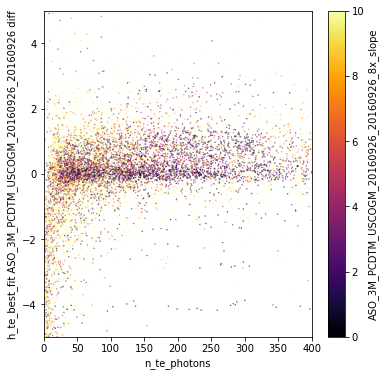

In [208]:
f, ax = plt.subplots(figsize=(6,6))
col1 = 'n_te_photons'
col2 = atl08_diff_col
ax = atl08_crop.plot(ax=ax, kind='scatter', x=col1, y=col2, s=0.1, \
                                   c=atl08_slope_col, cmap='inferno', vmin=0, vmax=10)
ax.set_ylim(-5, 5)
ax.set_xlim(0, 400)

(0.0, 400.0)

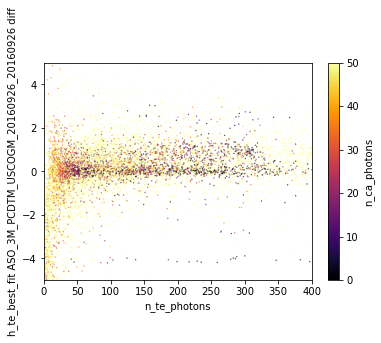

In [230]:
f, ax = plt.subplots()
col1 = 'n_te_photons'
col2 = atl08_diff_col
ax = atl08_crop.plot(ax=ax, kind='scatter', x=col1, y=col2, s=0.1, \
                                   c='n_ca_photons', cmap='inferno', vmin=0, vmax=50)
ax.set_ylim(-5, 5)
ax.set_xlim(0, 400)

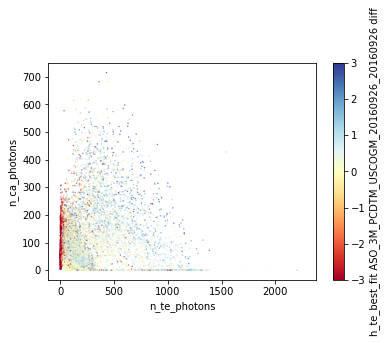

In [212]:
f, ax = plt.subplots()
col1 = 'n_te_photons'
col2 = 'n_ca_photons'
c = atl08_diff_col

ax = atl08_crop.plot(ax=ax, kind='scatter', x=col1, y=col2, s=0.1, \
                                   c=c, cmap='RdYlBu', vmin=-3, vmax=3)
#ax.set_ylim(0, 100)
#ax.set_xlim(0, 100)

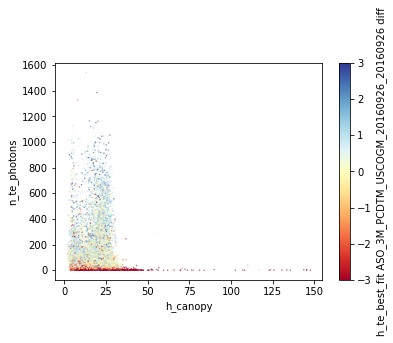

In [272]:
f, ax = plt.subplots()
col1 = 'h_canopy'
col2 = 'n_te_photons'
c = atl08_diff_col

ax = atl08_crop.plot(ax=ax, kind='scatter', x=col1, y=col2, s=0.1, \
                                   c=c, cmap='RdYlBu', vmin=-3, vmax=3)
#ax.set_ylim(0, 100)
#ax.set_xlim(0, 100)

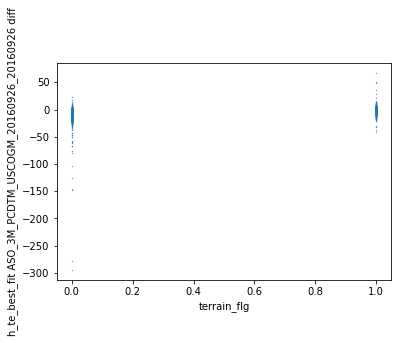

In [834]:
col1 = 'terrain_flg'
col2 = atl08_diff_col
ax = atl08_crop.plot(kind='scatter', x=col1, y=col2, s=0.1)

In [222]:
atl06sr_crop.columns

Index(['geometry', 'cycle', 'delta_time', 'dh_fit_dx', 'dh_fit_dy', 'distance',
       'gt', 'h_mean', 'h_sigma', 'n_fit_photons', 'pflags', 'rgt',
       'rms_misfit', 'segment_id', 'spot', 'w_surface_window_final', 'acqdate',
       'x', 'y', 'doy', 'decyear', 'dowy',
       'ASO_3M_PCDTM_USCOGM_20160926_20160926',
       'h_mean ASO_3M_PCDTM_USCOGM_20160926_20160926 diff',
       'ASO_3M_PCDTM_USCOGM_20160926_20160926_8x_slope',
       'ASO_3M_PCDTM_USCOGM_20160926_20160926_8x_tri',
       'ASO_3M_PCDTM_USCOGM_20160926_20160926_8x_roughness'],
      dtype='object')

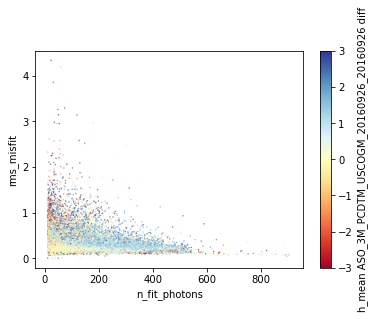

In [225]:
f, ax = plt.subplots()
col1 = 'n_fit_photons'
col2 = 'rms_misfit'
c = atl06sr_diff_col

ax = atl06sr_crop.plot(ax=ax, kind='scatter', x=col1, y=col2, s=0.1, \
                                   c=c, cmap='RdYlBu', vmin=-3, vmax=3)
#ax.set_ylim(0, 100)
#ax.set_xlim(0, 100)

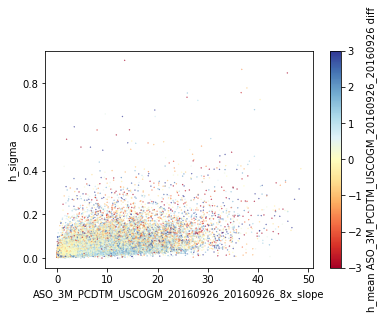

In [227]:
f, ax = plt.subplots()
col1 = 'ASO_3M_PCDTM_USCOGM_20160926_20160926_8x_slope'
col2 = 'h_sigma'
c = atl06sr_diff_col

ax = atl06sr_crop.plot(ax=ax, kind='scatter', x=col1, y=col2, s=0.1, \
                                   c=c, cmap='RdYlBu', vmin=-3, vmax=3)
#ax.set_ylim(0, 100)
#ax.set_xlim(0, 100)

## Use SNOTEL observations to define snow-free days

In [363]:
snotel_depth_thresh = 0.1

In [364]:
clim = (-3, 3)
asc = False

# ATL06-SR Dates

In [365]:
atl06sr_dates_valid = pd.to_datetime(atl06sr_crop['acqdate'].unique(), utc=True)
#gedi_dates_valid = pd.to_datetime(gedi_crop[gedi_diff_col].dropna().index.date, utc=True).unique()

In [374]:
atl06sr_crop.index = atl06sr_crop.index.to_timestamp()

In [375]:
idx = (snwd_df[site_codes].loc[atl06sr_dates_valid] < snotel_depth_thresh).any(axis=1)
idx = idx[idx]
atl06sr_crop_snowfree_idx = atl06sr_crop.index.normalize().isin(idx.index.date)

In [376]:
atl06sr_crop[atl06sr_crop_snowfree_idx]['acqdate'].value_counts()

2018-11-20    6998
2019-07-11    6466
2020-05-18    5236
2020-10-07    4826
2020-07-19    4345
2019-11-08    3684
2020-04-19    3663
2019-08-09    3399
2021-04-17    1092
2019-04-11    1059
2019-08-19     908
2019-05-10     801
2020-07-08     748
2020-05-07     619
2019-07-21     558
2021-07-06     350
2018-11-09     307
2021-05-16     249
2020-08-06     149
2020-10-18      41
2019-04-22      32
2021-05-06       7
Name: acqdate, dtype: int64

In [380]:
atl06sr_crop[atl06sr_crop_snowfree_idx]['diff_plus'].describe()

count    45537.000000
mean        -0.074160
std          1.584775
min        -50.713634
25%         -0.630769
50%          0.079998
75%          0.574001
max         16.961377
Name: diff_plus, dtype: float64

count    13904.000000
mean         0.074817
std          0.947014
min        -22.678756
25%         -0.156125
50%          0.050352
75%          0.322857
max          7.351457
Name: h_mean ASO_3M_PCDTM_USCOGM_20160926_20160926 diff, dtype: float64
count    24345.000000
mean         0.603919
std          1.753100
min        -47.598429
25%          0.108287
50%          0.631037
75%          1.168448
max         74.854247
Name: h_mean ASO_3M_PCDTM_USCOGM_20160926_20160926 diff, dtype: float64


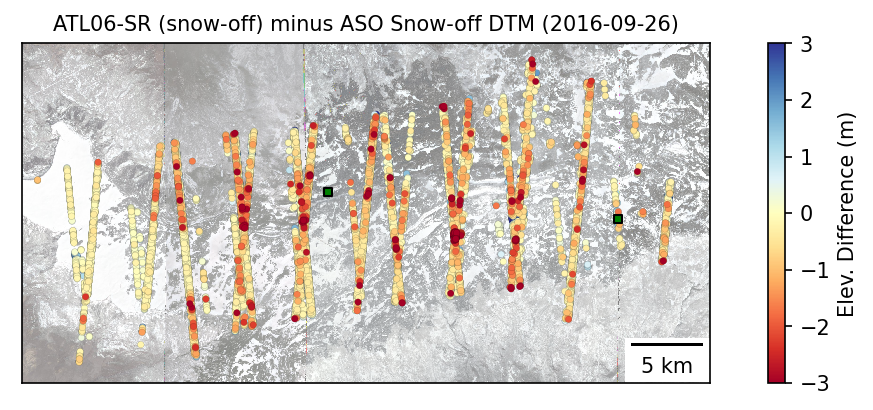

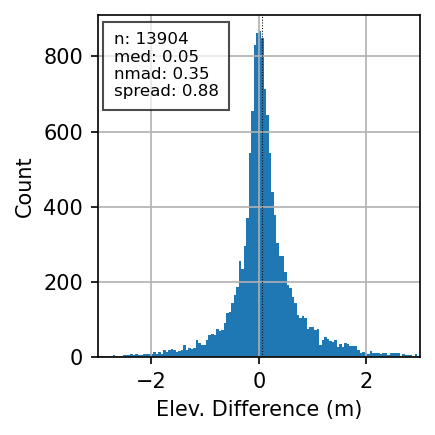

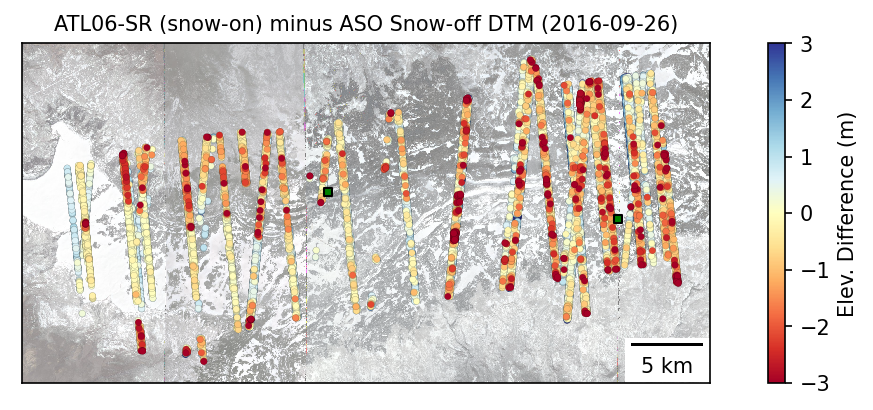

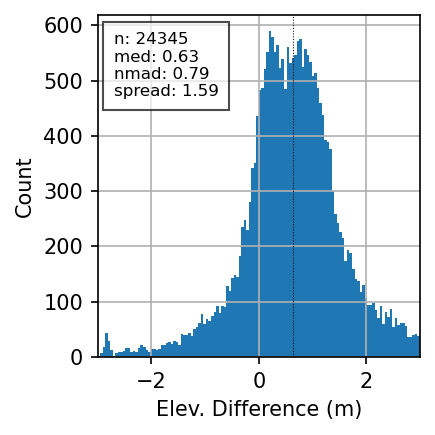

In [254]:
xover_plot2(atl06sr_crop[atl06sr_crop_snowfree_idx], atl06sr_diff_col, asc=asc, clim=clim, title='ATL06-SR (snow-off) minus ASO Snow-off DTM (2016-09-26)')
print(atl06sr_crop[atl06sr_crop_snowfree_idx][atl06sr_diff_col].describe())
xover_plot2(atl06sr_crop[~atl06sr_crop_snowfree_idx], atl06sr_diff_col, asc=asc, clim=clim, title='ATL06-SR (snow-on) minus ASO Snow-off DTM (2016-09-26)')
print(atl06sr_crop[~atl06sr_crop_snowfree_idx][atl06sr_diff_col].describe())

## Clip to radius around SNOTEL locaitons

In [290]:
r = 10000 #m

<AxesSubplot:>

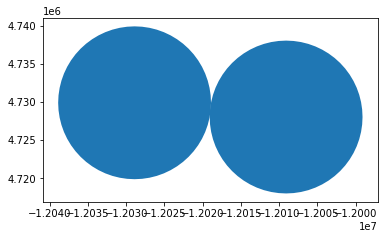

In [291]:
snotel_site_gdf.buffer(r).plot()

## Time series, aggregated by acqdate

In [141]:
dt_min_plot = '2018-09-01'
dt_max_plot = '2021-09-01'

(-20.0, 20.0)

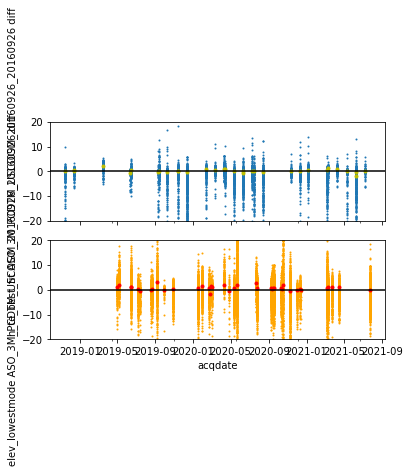

In [256]:
f, axa = plt.subplots(2,1, sharex=True, sharey=True)
pd.DataFrame(atl08_crop.drop(columns='geometry')).plot(ax=axa[0], x='acqdate', y=atl08_diff_col, kind='scatter', s=1)
pd.DataFrame(atl08_crop.drop(columns='geometry')).groupby('acqdate').median()[atl08_diff_col].plot(ax=axa[0], marker='o', markersize=3, lw=0, color='y')
pd.DataFrame(gedi_crop.drop(columns='geometry')).plot(ax=axa[1], x='acqdate', y=gedi_diff_col, kind='scatter', color='orange', s=1)
pd.DataFrame(gedi_crop.drop(columns='geometry')).groupby('acqdate').median()[gedi_diff_col].plot(ax=axa[1], marker='o', markersize=3, lw=0, color='r')
axa[0].axhline(0, color='k')
axa[1].axhline(0, color='k')
axa[0].set_ylim(-20, 20)

In [149]:
def altimetry_ts_plot(df, col, title):
    #f, ax = plt.subplots(figsize=(4,3), dpi=150)
    f, ax = plt.subplots(figsize=(6,4), dpi=150)
    pd.DataFrame(df.drop(columns='geometry')).plot(ax=ax, x='acqdate', y=col, kind='scatter', s=1, color='r', alpha=0.01)
    #mad = pd.DataFrame(df.drop(columns='geometry')).groupby('acqdate').mad()[col]
    label = None
    if 'ATL08' in title:
        label = 'ATL08'
    elif 'GEDI' in title:
        label = 'GEDI'
    elif 'ATL06-SR' in title:
        label = 'ATL06-SR'
    label = ''
    df_med = pd.DataFrame(df.drop(columns='geometry')).groupby('acqdate').median()[col]
    df_med.plot(ax=ax, marker='o', markersize=4, markeredgecolor='k', markeredgewidth=0.5, lw=0, color='r', label=label)
    ax.autoscale(False)
    #snotel_df.plot(ax=ax, color='gray', lw=0.5, label='SNOTEL')
    snotel_df.plot(ax=ax, color='gray', lw=0.5, style=['--','-'])
    ax.axhline(0, color='k', lw=0.5)
    ax.yaxis.set_minor_locator(AutoMinorLocator())
    #ax.xaxis.set_minor_locator(AutoMinorLocator())
    #ax.tick_params(which='minor')
    ax.set_ylim(-8, 8)
    ax.set_ylabel('Elevation difference (m)')
    ax.set_xlim(dt_min_plot, dt_max_plot)
    ax.set_title(title)
    ax.format_xdata = mdates.DateFormatter('%Y-%m-%d')
    f.autofmt_xdate()
    #ax.legend(loc='upper right', fontsize=6)
    ax.legend(loc='upper right')
    ax.grid(axis='y', which='major', alpha=0.5)
    #plt.tight_layout()

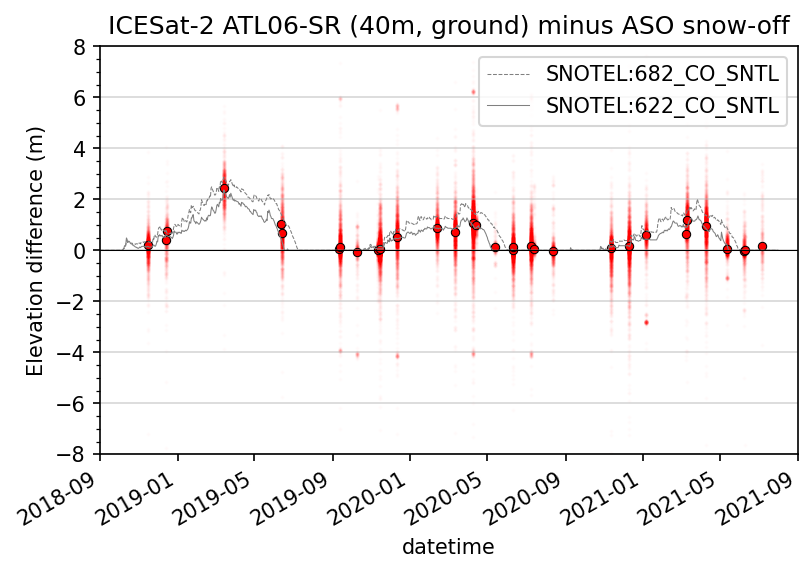

In [901]:
altimetry_ts_plot(atl06sr_crop, atl06sr_diff_col, title='ICESat-2 ATL06-SR (40m, ground) minus ASO snow-off')

# Filter outliers

In [378]:
#from scipy.stats import zscore

In [383]:
zscore_thresh = 3
absdiff_thresh = 5.0

## Stats aggregation

In [ ]:
df = atl06sr_crop
col = atl06sr_diff_col

In [ ]:
snotel_df.index = pd.to_datetime(snotel_df.index.date)
snotel_df['SNOTEL_mean'] = snotel_df.mean(axis=1)

In [461]:
snotel_df

,SNOTEL:682_CO_SNTL,SNOTEL:622_CO_SNTL,SNOTEL_mean
2016-06-01,0.9398,0.3810,0.6604
2016-06-02,0.8890,0.3048,0.5969
2016-06-03,0.8128,0.2286,0.5207
2016-06-04,0.7620,0.1270,0.4445
2016-06-05,0.6604,0.0762,0.3683
...,...,...,...
2021-07-28,0.0000,0.0000,0.0000
2021-07-29,0.0000,0.0000,0.0000
2021-07-30,0.0000,0.0000,0.0000
2021-07-31,0.0000,0.0000,0.0000


In [131]:
def stats_agg(df, col, snotel_col='SNOTEL_mean', title=None):
    stats = df.groupby('acqdate')[col].aggregate(['median', nmad, p16, p84, 'count']).dropna()
    stats.index = pd.to_datetime(stats.index)

    stats_snotel_join = stats.join(snotel_df)
    add_dowy(stats_snotel_join)

    stat_col = 'median'
    out_col = f'{stat_col} - {snotel_col}'
    stats_snotel_join[out_col] = stats_snotel_join[stat_col] - stats_snotel_join[snotel_col]

    #(stats_snotel_join.iloc[:,-3:]**2).mean()**.5
    #stats_snotel_join.iloc[:,-3:].describe()
    #stats_snotel_join.iloc[:,-3:].plot(kind='bar')
    
    SS_tot = ((stats_snotel_join[stat_col] - stats_snotel_join[stat_col].mean())**2).sum()
    SS_res = (stats_snotel_join[out_col]**2).sum()
    R2 = 1 - (SS_res/SS_tot)

    RMSE = (stats_snotel_join[out_col]**2).mean()**.5
    bias = stats_snotel_join[out_col].mean()

    f, ax = plt.subplots()
    stats_snotel_join.plot(ax=ax, kind='scatter', x=snotel_col, y='median', c='dowy', cmap='twilight')
    ax.plot(np.arange(0,4), np.arange(0,4), color='r', lw=0.5)
    ax.set_aspect('equal')
    if title is None:
        title = f'{col}\n daily median vs. daily SNOTEL SD' 
    ax.set_title(title)
    ax.set_ylabel(f'Daily aggregated {stat_col} SD (m)')
    ax.set_xlabel(f'{snotel_col} daily SD (m)')
    df_str = f'n: {stats_snotel_join.shape[0]}\nbias: {bias:+0.2f}\nRMSE: {RMSE:0.2f}\n$R^2$: {R2:0.2f}'
    ax.text(0.05, 0.95, df_str, va='top', color='k', transform=ax.transAxes, fontsize=10, \
                bbox={'facecolor': 'w', 'alpha': 0.5, 'pad': 5})
    
    #return stats_snotel_join

In [132]:
stats_agg(atl06sr_crop, atl06sr_diff_col, title='Snow depth: ATL06-SR vs. SNOTEL')

/Users/Hannah/opt/miniconda3/envs/datum_reproj2/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1374: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(


TypeError: Cannot join tz-naive with tz-aware DatetimeIndex

/nobackupp16/swbuild/deshean/miniconda3/envs/shean_py3/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1374: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(


Adding Day of Water Year (DOWY)


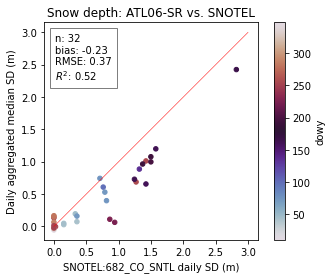

In [474]:
stats_agg(atl06sr_crop, atl06sr_diff_col, 'SNOTEL:682_CO_SNTL', title='Snow depth: ATL06-SR vs. SNOTEL')

/nobackupp16/swbuild/deshean/miniconda3/envs/shean_py3/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1374: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(


Adding Day of Water Year (DOWY)


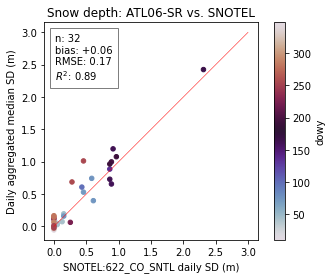

In [475]:
stats_agg(atl06sr_crop, atl06sr_diff_col, 'SNOTEL:622_CO_SNTL', title='Snow depth: ATL06-SR vs. SNOTEL')

# Old

In [786]:
df2 = pd.DataFrame(atl08_crop.drop(columns='geometry')).groupby('acqdate')[atl08_diff_col].aggregate(['median', nmad, p16, p84, 'count']).dropna()

/nobackupp16/swbuild/deshean/miniconda3/envs/shean_py3/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1374: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(


In [750]:
#df2 = pd.DataFrame(atl08_crop.drop(columns='geometry')).groupby('acqdate')[[atl08_diff_col, atl08_slope_col]].aggregate(['mean', 'std', 'median', nmad, p16, p84, 'count']).dropna()

In [787]:
df2 = pd.DataFrame(gedi_crop.drop(columns='geometry')).groupby('acqdate')[gedi_diff_col].aggregate(['median', nmad, p16, p84, 'count']).dropna()

/nobackupp16/swbuild/deshean/miniconda3/envs/shean_py3/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1374: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(


In [756]:
df2['spread'] = df2['p84'] - df2['p16']

In [757]:
df2

,median,nmad,p16,p84,count,spread
acqdate,,,,,,
2019-05-01,1.382080,1.542507,-0.744121,2.610078,278,3.354199
2019-05-08,1.766846,0.623663,1.157559,2.487148,1225,1.329590
2019-06-13,1.153076,2.348419,-1.949922,2.230186,3,4.180107
2019-06-16,1.209351,1.237734,-0.148350,2.512646,1618,2.660996
2019-07-08,0.324341,0.811884,-0.628037,1.232354,1028,1.860391
2019-07-12,-0.567871,0.813694,-2.865371,0.152383,23,3.017754
2019-08-18,0.030640,0.403408,-0.391846,0.641016,1536,1.032861
2019-08-21,0.217041,0.409743,-0.090029,1.208047,1247,1.298076
2019-09-05,2.865234,1.253660,1.044189,4.009443,902,2.965254


<AxesSubplot:xlabel='count', ylabel='spread'>

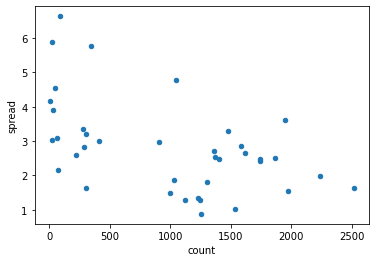

In [758]:
df2.plot.scatter(x='count', y='spread')

In [759]:
errors = pd.DataFrame([df2['median'] - df2['p16'], df2['p84'] - df2['median']]).abs()
errors

acqdate,2019-05-01,2019-05-08,2019-06-13,2019-06-16,2019-07-08,2019-07-12,2019-08-18,2019-08-21,2019-09-05,2019-09-28,...,2020-10-13,2020-10-16,2020-11-09,2020-12-02,2020-12-10,2021-03-07,2021-03-11,2021-03-23,2021-04-16,2021-07-24
0,2.126201,0.609287,3.102998,1.357700,0.952378,2.297500,0.422485,0.307070,1.821045,1.096553,...,1.713379,3.826743,1.855674,0.887036,1.369263,2.722080,1.15606,0.435010,1.510503,1.442285
1,1.227998,0.720303,1.077109,1.303296,0.908013,0.720254,0.610376,0.991006,1.144209,1.071553,...,1.585293,2.806440,1.771143,0.753784,1.452173,2.042402,0.81728,0.860029,1.026812,1.037500


<ErrorbarContainer object of 3 artists>

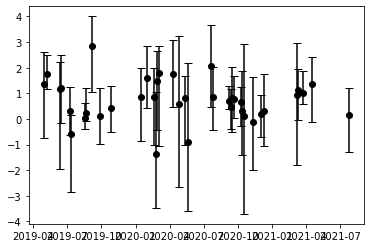

In [760]:
f, ax = plt.subplots()
ax.errorbar(df2.index, y=df2['median'], yerr=errors, fmt='ok', capsize=4)

<AxesSubplot:xlabel='acqdate'>

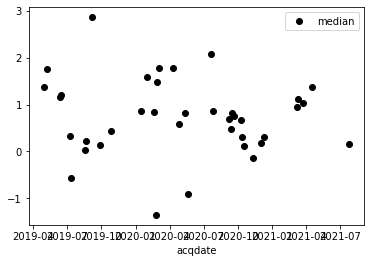

In [761]:
df2.plot(y='median', yerr=df2[['p16', 'p84']], fmt='ok', capsize=3)

<AxesSubplot:xlabel='acqdate'>

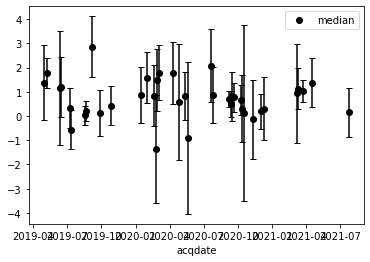

In [762]:
df2.plot(y='median', yerr='nmad', fmt='ok', capsize=3)

In [ ]:
snotel_df.loc[atl08_dates_valid]

## Boxplot

<AxesSubplot:title={'center':'h_te_best_fit ASO_3M_PCDTM_USCOGM_20160926_20160926 diff'}, xlabel='acqdate'>

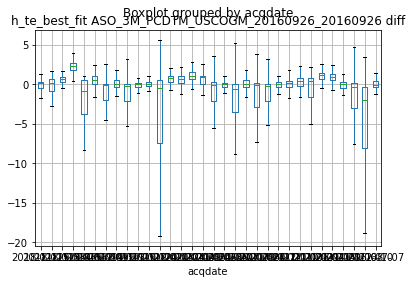

In [886]:
atl08_crop[[atl08_diff_col, 'acqdate']].dropna().boxplot(column=atl08_diff_col, by='acqdate', showfliers=False)

In [433]:
pd.to_datetime(atl08_crop.index.date)

DatetimeIndex(['2018-11-14', '2018-11-14', '2018-11-14', '2018-11-14',
               '2018-11-14', '2018-11-14', '2018-11-14', '2018-11-14',
               '2018-11-14', '2018-11-14',
               ...
               '2021-07-07', '2021-07-07', '2021-07-07', '2021-07-07',
               '2021-07-07', '2021-07-07', '2021-07-07', '2021-07-07',
               '2021-07-07', '2021-07-07'],
              dtype='datetime64[ns]', length=22068, freq=None)

In [432]:
#atl08_crop['acqdate'] = pd.to_datetime(atl08_crop.index.date)

/nobackupp16/swbuild/deshean/miniconda3/envs/shean_py3/lib/python3.9/site-packages/geopandas/geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [435]:
snotel_df.index.rename('acqdate', inplace=True)

In [633]:
atl08_crop.groupby('acqdate').median().index

Index([2018-10-17, 2018-11-14, 2018-11-15, 2018-12-13, 2018-12-14, 2019-01-11,
       2019-02-13, 2019-03-14, 2019-03-15, 2019-04-12, 2019-05-15, 2019-05-16,
       2019-06-12, 2019-06-14, 2019-07-17, 2019-09-11, 2019-09-13, 2019-10-10,
       2019-11-12, 2019-11-14, 2019-12-11, 2020-01-09, 2020-01-15, 2020-02-12,
       2020-03-11, 2020-03-12, 2020-04-09, 2020-04-14, 2020-05-12, 2020-05-13,
       2020-06-10, 2020-06-11, 2020-07-09, 2020-07-14, 2020-08-11, 2020-08-12,
       2020-10-08, 2020-11-09, 2020-11-11, 2020-12-10, 2021-01-06, 2021-03-09,
       2021-03-11, 2021-04-07, 2021-04-09, 2021-05-12, 2021-06-08, 2021-06-10,
       2021-07-07, 2021-07-12],
      dtype='object', name='acqdate')

In [644]:
xpos = atl08_crop.groupby('acqdate').median().index.array
xpos

<PandasArray>
[datetime.date(2018, 10, 17), datetime.date(2018, 11, 14),
 datetime.date(2018, 11, 15), datetime.date(2018, 12, 13),
 datetime.date(2018, 12, 14),  datetime.date(2019, 1, 11),
  datetime.date(2019, 2, 13),  datetime.date(2019, 3, 14),
  datetime.date(2019, 3, 15),  datetime.date(2019, 4, 12),
  datetime.date(2019, 5, 15),  datetime.date(2019, 5, 16),
  datetime.date(2019, 6, 12),  datetime.date(2019, 6, 14),
  datetime.date(2019, 7, 17),  datetime.date(2019, 9, 11),
  datetime.date(2019, 9, 13), datetime.date(2019, 10, 10),
 datetime.date(2019, 11, 12), datetime.date(2019, 11, 14),
 datetime.date(2019, 12, 11),   datetime.date(2020, 1, 9),
  datetime.date(2020, 1, 15),  datetime.date(2020, 2, 12),
  datetime.date(2020, 3, 11),  datetime.date(2020, 3, 12),
   datetime.date(2020, 4, 9),  datetime.date(2020, 4, 14),
  datetime.date(2020, 5, 12),  datetime.date(2020, 5, 13),
  datetime.date(2020, 6, 10),  datetime.date(2020, 6, 11),
   datetime.date(2020, 7, 9),  datetime.da

In [882]:
import seaborn as sns

In [ ]:
#bp_dict = atl08_crop.boxplot(column=atl08_diff_col, by='acqdate', showfliers=False, rot=90, grid=False)

In [879]:
atl08_acqdate_unique = np.sort(atl08_crop['acqdate'].unique().astype("datetime64[D]"))
gedi_acqdate_unique = np.sort(gedi_crop['acqdate'].unique().astype("datetime64[D]"))
atl06sr_acqdate_unique = np.sort(atl06sr_crop['acqdate'].unique().astype("datetime64[D]"))

In [880]:
atl08_acqdate_unique

array(['2018-10-17', '2018-11-14', '2018-11-15', '2018-12-13',
       '2018-12-14', '2019-01-11', '2019-02-13', '2019-03-14',
       '2019-03-15', '2019-04-12', '2019-05-15', '2019-05-16',
       '2019-06-12', '2019-06-14', '2019-07-17', '2019-09-11',
       '2019-09-13', '2019-10-10', '2019-11-12', '2019-11-14',
       '2019-12-11', '2020-01-09', '2020-01-15', '2020-02-12',
       '2020-03-11', '2020-03-12', '2020-04-09', '2020-04-14',
       '2020-05-12', '2020-05-13', '2020-06-10', '2020-06-11',
       '2020-07-09', '2020-07-14', '2020-08-11', '2020-08-12',
       '2020-10-08', '2020-11-09', '2020-11-11', '2020-12-10',
       '2021-01-06', '2021-03-09', '2021-03-11', '2021-04-07',
       '2021-04-09', '2021-05-12', '2021-06-08', '2021-06-10',
       '2021-07-07', '2021-07-12'], dtype='datetime64[D]')

In [ ]:
sns.boxplot(x='acqdate', y=atl08_diff_col, data=atl08_crop, order=atl08_acqdate_unique)

In [ ]:
snotel_df.boxplot(ax=ax, column='SNOTEL:682_CO_SNTL', by='acqdate', showfliers=False, rot=90, grid=False)

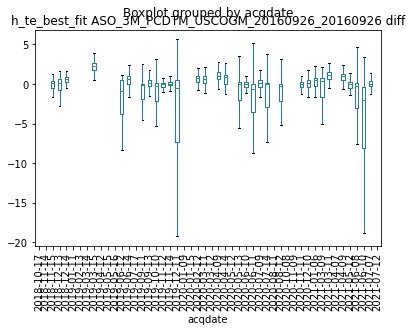

In [860]:
f, ax = plt.subplots()
#snotel_df.plot(ax=ax, color='gray', lw=0.5, label='SNOTEL')
#snotel_df.boxplot(ax=ax, column='SNOTEL:682_CO_SNTL', by='acqdate', showfliers=False, rot=90, grid=False)
bp_dict = atl08_crop.boxplot(ax=ax, column=atl08_diff_col, by='acqdate', showfliers=False, rot=90, grid=False)
#ax.plot(bp_dict)

In [ ]:
f, ax = plt.subplots()
#snotel_df.plot(ax=ax, color='gray', lw=0.5, label='SNOTEL')
atl08_crop.boxplot(ax=ax, column=atl08_diff_col, by='acqdate', showfliers=False, rot=90, grid=False, positions=pos)

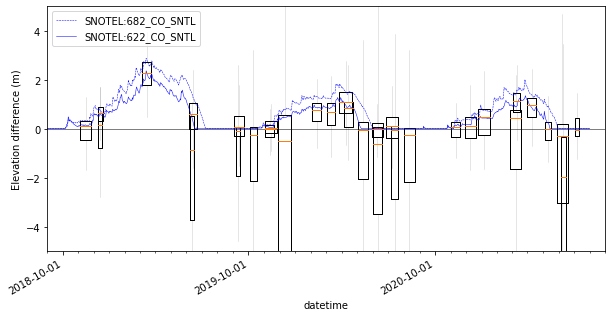

In [267]:
boxplot_date(atl08_crop, atl08_diff_col)

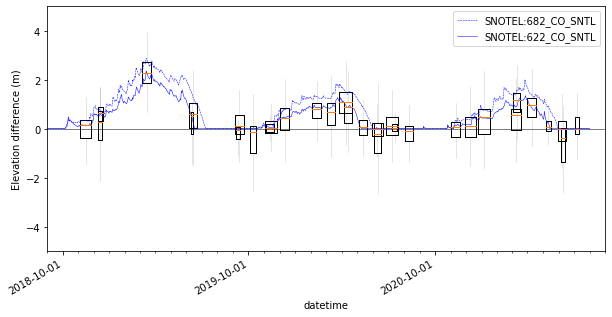

In [266]:
boxplot_date(atl08_crop[atl08_nphoton_idx], atl08_diff_col)

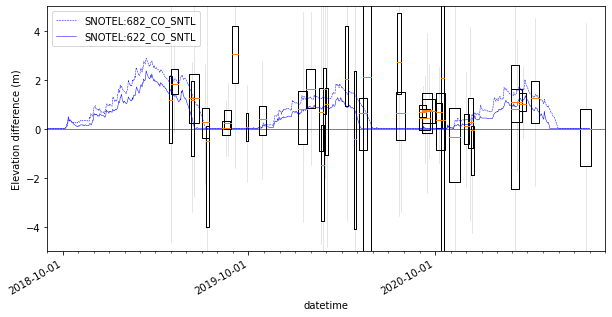

In [268]:
boxplot_date(gedi_crop, gedi_diff_col)

In [316]:
cl_fn = '/nobackup/deshean/gm_classification/27nov2010_tree_map_final_fix_4x.tif'

In [317]:
cl_src = rio.open(cl_fn)

In [318]:
col = sample_raster(atl08_crop, cl_src)

/nobackupp16/swbuild/deshean/miniconda3/envs/shean_py3/lib/python3.9/site-packages/geopandas/geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [319]:
idx = atl08_crop[col] == 1

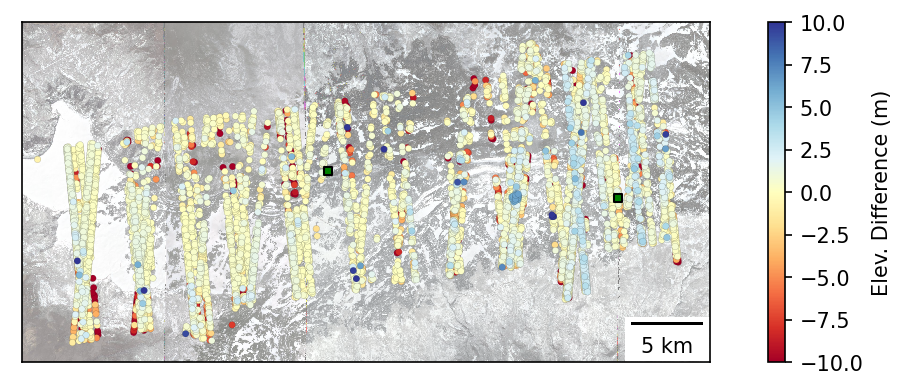

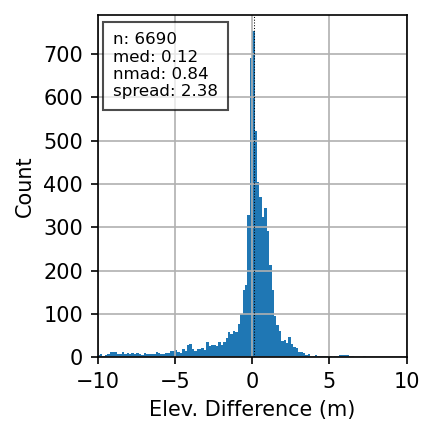

In [320]:
xover_plot2(atl08_crop[~idx], atl08_diff_col)

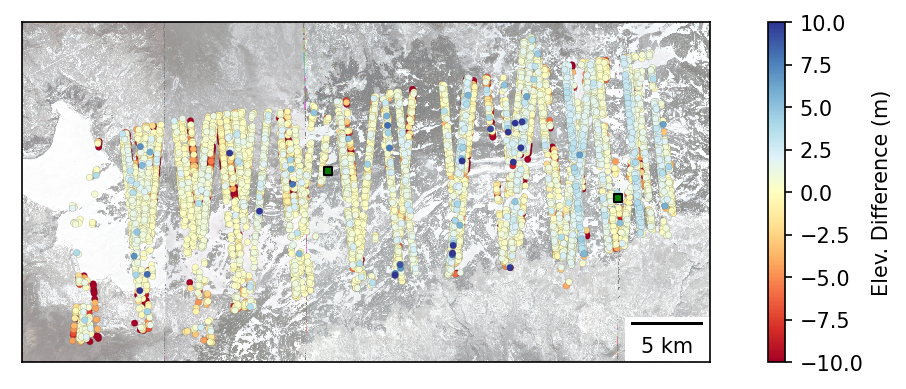

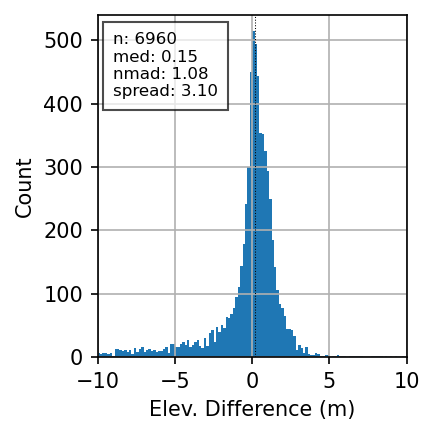

In [321]:
xover_plot2(atl08_crop[idx], atl08_diff_col)

In [322]:
cl_fn = './GM_combine_3trees_3aso_matrix.tif'

In [323]:
cl_src = rio.open(cl_fn)

In [194]:
gdaldem_fn = os.path.splitext(dem_fn)[0]+f'_slope.tif'
gdaldem_src = rio.open(gdaldem_fn)
gdaldem = gdaldem_src.read(1, masked=True)

In [ ]:
f, ax = plt.subplots(figsize=(6,3))
m = ax.imshow(gdaldem, vmin=0, vmax=40)
f.colorbar(m)

In [359]:
slope = rioxarray.open_rasterio(gdaldem_fn, masked=True).squeeze()
clmatrix = rioxarray.open_rasterio(cl_fn, masked=True).squeeze()

In [360]:
clmatrix

<xarray.DataArray (y: 6500, x: 12450)>
[80925000 values with dtype=float32]
Coordinates:
    band         int64 1
  * x            (x) float64 2.183e+05 2.183e+05 ... 2.557e+05 2.557e+05
  * y            (y) float64 4.336e+06 4.336e+06 ... 4.317e+06 4.317e+06
    spatial_ref  int64 0
Attributes:
    LAYER_TYPE:              athematic
    STATISTICS_MAXIMUM:      9
    STATISTICS_MEAN:         7.2166037518148
    STATISTICS_MEDIAN:       0
    STATISTICS_MINIMUM:      1
    STATISTICS_MODE:         0
    STATISTICS_SKIPFACTORX:  1
    STATISTICS_SKIPFACTORY:  1
    STATISTICS_STDDEV:       2.3092850623765
    scale_factor:            1.0
    add_offset:              0.0
    long_name:               Layer_1

In [350]:
#ds.rename({'band':'slope'})

In [324]:
col = sample_raster(atl08_crop, cl_src)

/nobackupp16/swbuild/deshean/miniconda3/envs/shean_py3/lib/python3.9/site-packages/geopandas/geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [331]:
treeless = [1,2,3]
sparse = [4,5,6]
dense = [7,8,9]

In [337]:
atl08_crop[col].value_counts()

9.0    5002
8.0    1940
6.0    1414
7.0     615
5.0     419
4.0     372
2.0     320
3.0     312
1.0     295
Name: GM_combine_3trees_3aso_matrix, dtype: int64

In [332]:
idx = atl08_crop[col].isin(treeless)

In [333]:
idx.value_counts()

False    48064
True       927
Name: GM_combine_3trees_3aso_matrix, dtype: int64

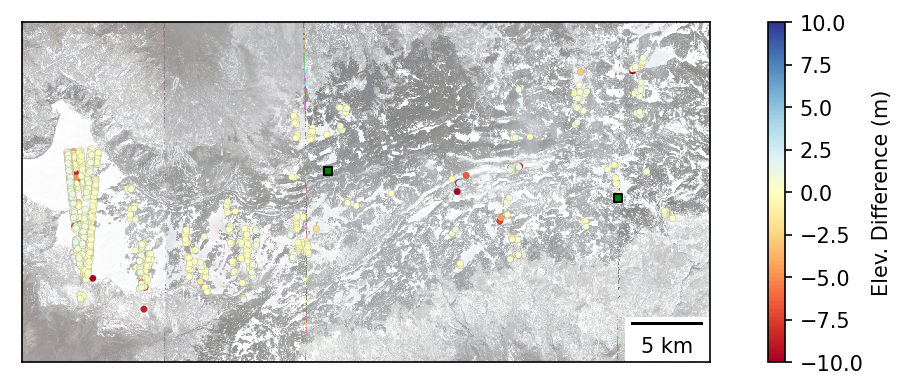

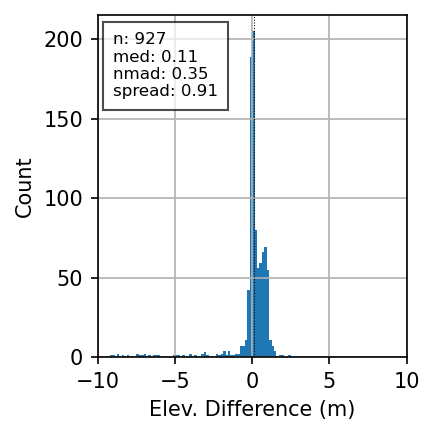

In [334]:
xover_plot2(atl08_crop[idx], atl08_diff_col)

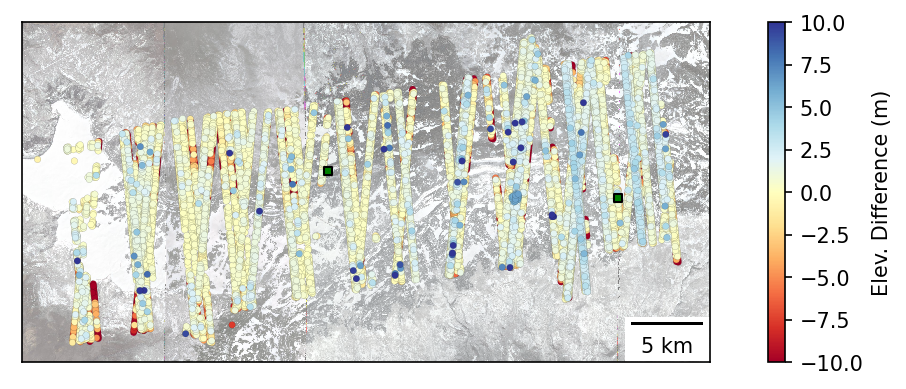

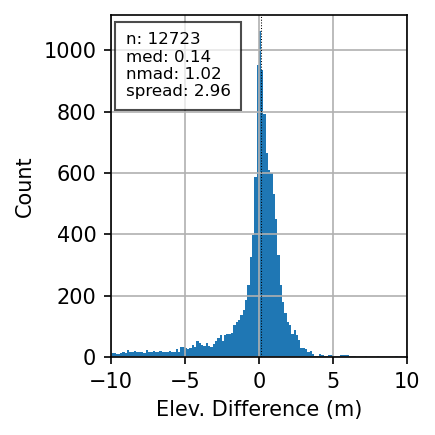

In [335]:
xover_plot2(atl08_crop[~idx], atl08_diff_col)

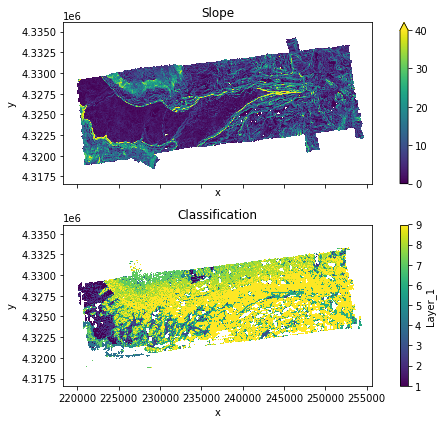

In [364]:
f, axa = plt.subplots(2, 1, figsize=(8,6), sharex=True, sharey=True)
slope.plot.imshow(ax=axa[0], vmin=0, vmax=40)
axa[0].axes.set_aspect('equal')
axa[0].set_title('Slope')
clmatrix.plot.imshow(ax=axa[1], vmin=1, vmax=9)
axa[1].axes.set_aspect('equal')
axa[1].set_title('Classification')
plt.tight_layout()

In [368]:
clmatrix_cp = clmatrix.copy()

In [372]:
clmatrix_cp

<xarray.DataArray (y: 6500, x: 12450)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
    band         int64 1
  * x            (x) float64 2.183e+05 2.183e+05 ... 2.557e+05 2.557e+05
  * y            (y) float64 4.336e+06 4.336e+06 ... 4.317e+06 4.317e+06
    spatial_ref  int64 0
Attributes:
    LAYER_TYPE:              athematic
    STATISTICS_MAXIMUM:      9
    STATISTICS_MEAN:         7.2166037518148
    STATISTICS_MEDIAN:       0
    STATISTICS_MINIMUM:      1
    STATISTICS_MODE:         0
    STATISTICS_SKIPFACTORX:  1
    STATISTICS_SKIPFACTORY:  1
    STATISTICS_STDDEV:       2.3092850623765
    scale_factor:            1.0
    add_offset:              0.0
    long_name:               Layer_1

In [370]:
clmatrix.isin(treeless)

<xarray.DataArray (y: 6500, x: 12450)>
array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])
Coordinates:
    band         int64 1
  * x            (x) float64 2.183e+05 2.183e+05 ... 2.557e+05 2.557e+05
  * y            (y) float64 4.336e+06 4.336e+06 ... 4.317e+06 4.317e+06
    spatial_ref  int64 0

In [375]:
clmatrix_cp.sel[clmatrix.isin(treeless)]

TypeError: 'method' object is not subscriptable

In [381]:
clmatrix_cp.where(clmatrix.isin(treeless))

<xarray.DataArray (y: 6500, x: 12450)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
    band         int64 1
  * x            (x) float64 2.183e+05 2.183e+05 ... 2.557e+05 2.557e+05
  * y            (y) float64 4.336e+06 4.336e+06 ... 4.317e+06 4.317e+06
    spatial_ref  int64 0
Attributes:
    LAYER_TYPE:              athematic
    STATISTICS_MAXIMUM:      9
    STATISTICS_MEAN:         7.2166037518148
    STATISTICS_MEDIAN:       0
    STATISTICS_MINIMUM:      1
    STATISTICS_MODE:         0
    STATISTICS_SKIPFACTORX:  1
    STATISTICS_SKIPFACTORY:  1
    STATISTICS_STDDEV:       2.3092850623765
    scale_factor:            1.0
    add_offset:              0.0
    long_name:               Layer_1

### Try to Find Snow-Off Dates Based on Photon Counts
According to thresholds found by Simon and Cesar:
* Strong beams: > 186 photons = snow on 
* Weak beams: > 50 photons = snow on 

In [119]:
atl06sr_gdf.head(2)

,distance,dh_fit_dx,gt,spot,w_surface_window_final,h_mean,dh_fit_dy,n_fit_photons,pflags,cycle,...,rms_misfit,delta_time,segment_id,geometry,acqdate,x,y,doy,decyear,dowy
time,,,,,,,,,,,,,,,,,,,,,
2018-11-09 22:09:43.662998,5.382001e+06,0.367318,20,1,9.386548,774.110259,0.0,41,0,1,...,0.506044,2.703658e+07,268398,POINT (-120.00053 48.33917),2018-11-09,-120.000526,48.339165,313,2018.857324,40
2018-11-09 22:09:43.789001,5.382903e+06,0.028568,20,1,3.000000,919.941824,0.0,42,0,1,...,0.305572,2.703658e+07,268443,POINT (-120.00167 48.34723),2018-11-09,-120.001665,48.347225,313,2018.857324,40


In [107]:
strong = [1,3,5]
weak = [2,4,6]

atl06sr_strong = atl06sr_gdf.loc[atl06sr_gdf['spot'].isin(strong)]
atl06sr_weak = atl06sr_gdf.loc[atl06sr_gdf['spot'].isin(weak)]

In [108]:
atl06sr_strong['month'] = atl06sr_strong.index.month

/Users/Hannah/opt/miniconda3/envs/datum_reproj3/lib/python3.8/site-packages/geopandas/geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


In [109]:
atl06sr_weak['month'] = atl06sr_weak.index.month

In [110]:
atl06sr_weak

,delta_time,w_surface_window_final,dh_fit_dx,spot,segment_id,pflags,h_mean,gt,rms_misfit,h_sigma,...,cycle,distance,dh_fit_dy,rgt,geometry,acqdate,doy,decyear,dowy,month
time,,,,,,,,,,,,,,,,,,,,,
2018-10-15 23:22:20.018965,2.488094e+07,3.000000,-0.018228,4,210188,0,2501.377184,30,0.091912,0.033182,...,1,4.215353e+06,0.0,265,POINT (269304.074 4196719.705),2018-10-15,288,2018.788969,15,10
2018-10-15 23:22:20.021811,2.488094e+07,3.000000,-0.010939,4,210189,0,2501.116873,30,0.109110,0.028329,...,1,4.215373e+06,0.0,265,POINT (269302.684 4196739.709),2018-10-15,288,2018.788969,15,10
2018-10-15 23:22:20.027481,2.488094e+07,3.000000,-0.000515,4,210191,0,2501.053838,30,0.107823,0.032855,...,1,4.215413e+06,0.0,265,POINT (269299.893 4196779.715),2018-10-15,288,2018.788969,15,10
2018-10-15 23:22:20.030306,2.488094e+07,3.000000,0.008181,4,210192,0,2501.176924,30,0.156936,0.041974,...,1,4.215434e+06,0.0,265,POINT (269298.498 4196799.719),2018-10-15,288,2018.788969,15,10
2018-10-15 23:22:20.033127,2.488094e+07,3.000000,0.004802,4,210193,0,2501.271832,30,0.169124,0.045422,...,1,4.215454e+06,0.0,265,POINT (269297.105 4196819.722),2018-10-15,288,2018.788969,15,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-02-06 13:36:15.554883,1.293898e+08,12.636195,0.494956,4,211392,0,3157.242677,40,0.941195,0.228813,...,14,4.239481e+06,0.0,707,POINT (288131.432 4220018.001),2022-02-06,37,2022.100183,129,2
2022-02-06 13:36:15.557691,1.293898e+08,13.676677,0.535804,4,211393,0,3167.738831,40,1.400303,0.433012,...,14,4.239501e+06,0.0,707,POINT (288130.038 4220038.003),2022-02-06,37,2022.100183,129,2
2022-02-06 13:36:15.560501,1.293898e+08,12.052330,0.472031,4,211394,0,3178.398925,40,0.968869,0.266429,...,14,4.239521e+06,0.0,707,POINT (288128.654 4220058.005),2022-02-06,37,2022.100183,129,2


Text(0.5, 1.0, 'Strong Beams')

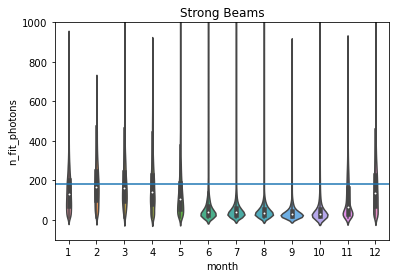

In [111]:
import seaborn as sns

fig, ax = plt.subplots()
sns.violinplot(y='n_fit_photons', x='month', data=atl06sr_strong, showfliers=False, ax=ax)
ax.axhline(y=180)
ax.set_ylim(-100,1000)
plt.title('Strong Beams')

Text(0.5, 1.0, 'Weak Beams')

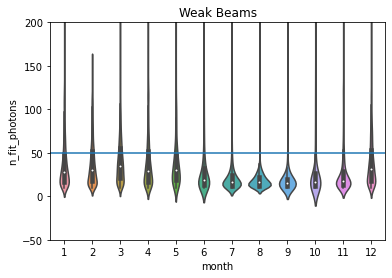

In [112]:
fig, ax = plt.subplots()
sns.violinplot(y='n_fit_photons', x='month', data=atl06sr_weak, showfliers=False, ax=ax)
ax.axhline(y=50)
ax.set_ylim(-50,200)
plt.title('Weak Beams')

In [113]:
atl06sr_strong_snowoff = atl06sr_strong.loc[atl06sr_strong['n_fit_photons'] > 186 ]
atl06sr_weak_snowoff = atl06sr_weak.loc[atl06sr_weak['n_fit_photons'] > 50]

In [114]:
snowoff_gdfs = [atl06sr_strong_snowoff, atl06sr_weak_snowoff]
atl06sr_pe_snowoff = pd.concat(snowoff_gdfs)

In [132]:
atl06sr_pe_snowoff.head(2)

,distance,dh_fit_dx,gt,spot,w_surface_window_final,h_mean,dh_fit_dy,n_fit_photons,pflags,cycle,...,rms_misfit,delta_time,segment_id,geometry,acqdate,x,y,doy,decyear,dowy
time,,,,,,,,,,,,,,,,,,,,,
2018-11-09 22:09:47.057999,5.406245e+06,-0.010414,40,3,3.0,1891.370605,0.0,284,0,1,...,0.402902,2.703659e+07,269608,POINT (-119.98895 48.55893),2018-11-09,-119.988946,48.558932,313,2018.857325,40
2018-11-09 22:09:47.061001,5.406265e+06,-0.095455,40,3,3.0,1890.031545,0.0,275,4,1,...,0.541101,2.703659e+07,269609,POINT (-119.98897 48.55911),2018-11-09,-119.988971,48.559105,313,2018.857325,40


In [53]:
add_dowy(snwd_df)

Adding Day of Water Year (DOWY)


In [54]:
snwd_df.index.is_unique

True

Text(0.5, 1.0, 'Snotel > 10 cm')

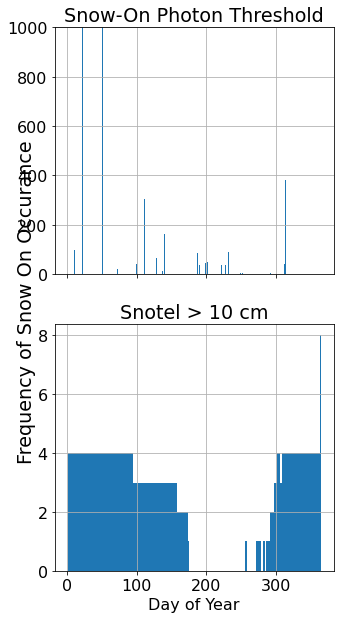

In [632]:
fig, ax = plt.subplots(2,1, figsize = (5, 10), sharex = True)
atl06sr_pe_snowoff['doy'].hist(bins=365, range=(0,365), ax=ax[0])
snwd_df[~idx]['doy'].hist(bins=365, range=(0,365), ax=ax[1])
ax[0].set_ylim(0,1000)
plt.xlabel('Day of Year')
fig.supylabel('Frequency of Snow On Occurance')
ax[0].set_title('Snow-On Photon Threshold')
ax[1].set_title('Snotel > 10 cm')